<a href="https://colab.research.google.com/github/hidayetyakupoglu/wind-data/blob/main/T11_2016_GF_new_cnn_SON_bigru.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install scikit-learn==1.0.2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.5/26.5 MB 60.8 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.5.2
    Uninstalling scikit-learn-1.5.2:
      Successfully uninstalled scikit-learn-1.5.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 1.22.0 requires scikit-learn>=1.2.2, but you have scikit-learn 1.0.2 which is incompatible.


In [2]:
# prompt: https://github.com/hidayetyakupoglu/wind-data.git  bağlanmak istiyorum,

!git clone https://github.com/hidayetyakupoglu/wind-data.git


Cloning into 'wind-data'...
remote: Enumerating objects: 41, done.
remote: Counting objects: 100% (41/41), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 41 (delta 14), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (41/41), 98.90 MiB | 12.46 MiB/s, done.
Resolving deltas: 100% (14/14), done.
Updating files: 100% (18/18), done.


In [3]:
!pip install openpyxl
!pip install xgboost
!pip install lightgbm
!pip install imbalanced-learn

In [4]:
# prompt: /content/wind-data/wind_fault.xlsx klasörünü aç
import pandas as pd
import openpyxl





In [5]:
import os
import pandas as pd
import numpy as np
from scipy import stats
from sklearn import preprocessing
import random
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import joblib
import seaborn as sns
sns.set(color_codes=True)
import matplotlib.pyplot as plt
from tensorflow import keras

from numpy.random import seed

#import logging
#logging.basicConfig(level=logging.DEBUG)
#tf._logging.set_verbosity(tf._logging.error)

#tensorflow.random.set_seed
from keras.layers import Input, Dropout, Dense, LSTM, TimeDistributed, RepeatVector
from keras.models import Model
from keras import regularizers
from keras.layers import GRU, LSTM
from sklearn.metrics import plot_confusion_matrix, classification_report
import plotly.express as px
from sklearn.preprocessing import Normalizer

from keras.layers import Dense
from keras.models import Sequential

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

from scipy.spatial.distance import mahalanobis

import xgboost as xgb
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import plot_confusion_matrix, classification_report

from sklearn.neighbors import KNeighborsClassifier

from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.feature_selection import (f_classif, SelectKBest)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from lightgbm import LGBMClassifier
from sklearn import metrics

from sklearn.feature_extraction.text import CountVectorizer


from imblearn.over_sampling import SMOTE

from matplotlib import pyplot as plt
import seaborn as sns

import tensorflow as tf
sns.set_style('whitegrid')
%matplotlib inline
import keras
import keras.backend as k
from keras.layers import GRU, LSTM
from keras.models import Sequential
from keras.models import Model
from keras import regularizers
from keras.callbacks import History
import warnings
warnings.filterwarnings("ignore")

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [6]:
df = pd.read_excel('/content/wind-data/T11_2016.xlsx')


In [588]:
df1=df.copy()
# prompt: veri çerçevesine fault sütunu ekle, bu satırın fault değerine 'GF' diğerlerine 'NF' yaz

# Assuming 'df' is your DataFrame and the timestamp column is named 'Timestamp'
df['Fault'] = 'NF'  # Initialize the 'Fault' column with 'NF' for all rows
df.loc[df['Timestamp'] == '2016-03-03T19:20:00+00:00', 'Fault'] = 'GF'
df.loc[df['Timestamp'] == '2016-10-17T17:50:00+00:00', 'Fault'] = 'HF'


In [589]:
# prompt: Unnamed: 0 adlı sütunu sil
dd0=df.copy()
ddf=dd0.copy()
ddf.drop('Turbine_ID', axis=1, inplace=True)
data=ddf.copy()
dd=data.copy()

In [590]:
perc=0.30   # test oranı orn:0.3 ise %70 train %30 testtir
fau='GF'   # arıza türleridir 'GF' 'AF' 'MF' 'FF' 'EF'
fau

'GF'

In [591]:
# prompt: dd Timestamp index yap ve sıraya koy

# Convert the 'Timestamp' column to datetime objects
dd['Timestamp'] = pd.to_datetime(dd['Timestamp'])

# Set the 'Timestamp' column as the index
dd = dd.set_index('Timestamp')

# Sort the DataFrame by the index (Timestamp)
dd = dd.sort_index()

# Now your DataFrame 'dd' has a DateTimeIndex and is sorted chronologically.

In [592]:
# prompt: Amb_WindSpeed_Max  ve Grd_Prod_Pwr_Max sütunlarının bulunduğu df oluştur

df_newf = dd[['Amb_WindSpeed_Max', 'Grd_Prod_Pwr_Max']]
print(df_newf)

                           Amb_WindSpeed_Max  Grd_Prod_Pwr_Max
Timestamp                                                     
2016-01-01 00:00:00+00:00                8.6             368.9
2016-01-01 00:10:00+00:00               11.1             430.4
2016-01-01 00:20:00+00:00                9.9             468.3
2016-01-01 00:30:00+00:00                9.4             581.2
2016-01-01 00:40:00+00:00               11.6             641.9
...                                      ...               ...
2016-12-31 23:10:00+00:00               12.4            1349.3
2016-12-31 23:20:00+00:00               19.4            1353.9
2016-12-31 23:30:00+00:00               17.6            1318.9
2016-12-31 23:40:00+00:00               17.7             964.3
2016-12-31 23:50:00+00:00               13.0            1217.2

[52446 rows x 2 columns]


# Z-skoru yöntemi ile filtreleme
mean = df_newf.mean()
std_dev = df_newf.std()
z_scores = (df_newf - mean) / std_dev

threshold_z = 5
filtered_data_z = df_newf[(z_scores.abs() < threshold_z).all(axis=1)]

# IQR yöntemi ile filtreleme
Q1 = df_newf.quantile(0.25)
Q3 = df_newf.quantile(0.75)
IQR = Q3 - Q1
filtered_data_iqr = df_newf[~((df_newf < (Q1 - 1.5 * IQR)) | (df_newf > (Q3 + 1.5 * IQR))).any(axis=1)]

# Sonuçları görüntüleme
print("Z-skoru ile filtrelenmiş veri:")
print(filtered_data_z)
print("\nIQR ile filtrelenmiş veri:")
print(filtered_data_iqr)

# Z-skoru yöntemi ile filtreleme
mean = df_newf.mean()
std_dev = df_newf.std()
z_scores = (df_newf - mean) / std_dev

threshold_z = 5
filtered_data_z = df_newf[(z_scores.abs() < threshold_z).all(axis=1)]

# IQR yöntemi ile filtreleme
Q1 = df_newf.quantile(0.25)
Q3 = df_newf.quantile(0.75)
IQR = Q3 - Q1
filtered_data_iqr = df_newf[~((df_newf < (Q1 - 1.5 * IQR)) | (df_newf > (Q3 + 1.5 * IQR))).any(axis=1)]

# Sonuçları görüntüleme
print("Z-skoru ile filtrelenmiş veri:")
print(filtered_data_z)
print("\nIQR ile filtrelenmiş veri:")
print(filtered_data_iqr)

In [593]:
# prompt: df_newf yalnızca NF leri seç

df_newf = dd[dd['Fault'] == 'NF'][['Amb_WindSpeed_Max', 'Grd_Prod_Pwr_Max']]
print(df_newf)

                           Amb_WindSpeed_Max  Grd_Prod_Pwr_Max
Timestamp                                                     
2016-01-01 00:00:00+00:00                8.6             368.9
2016-01-01 00:10:00+00:00               11.1             430.4
2016-01-01 00:20:00+00:00                9.9             468.3
2016-01-01 00:30:00+00:00                9.4             581.2
2016-01-01 00:40:00+00:00               11.6             641.9
...                                      ...               ...
2016-12-31 23:10:00+00:00               12.4            1349.3
2016-12-31 23:20:00+00:00               19.4            1353.9
2016-12-31 23:30:00+00:00               17.6            1318.9
2016-12-31 23:40:00+00:00               17.7             964.3
2016-12-31 23:50:00+00:00               13.0            1217.2

[52444 rows x 2 columns]


In [594]:
filtered_data_iqr=df_newf.copy()

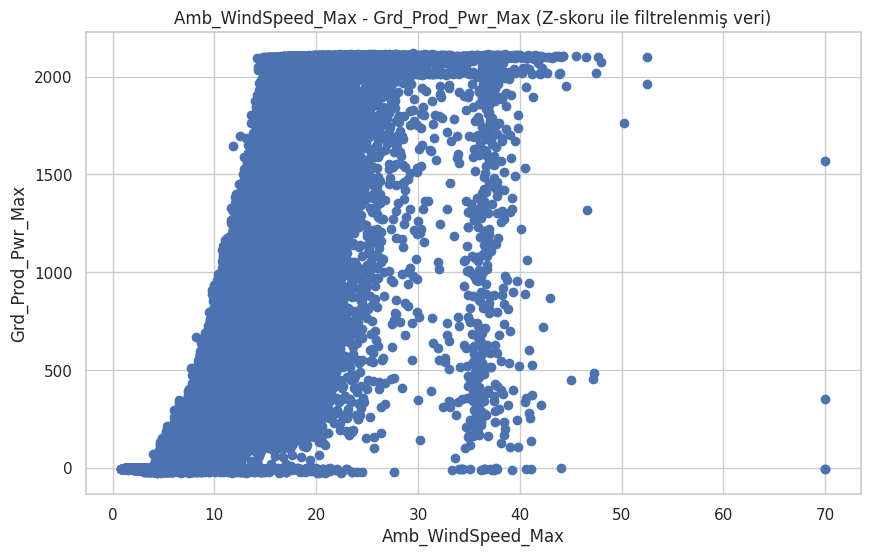

In [595]:
# prompt: Z-skoru ile filtrelenmiş veri nin Amb_WindSpeed_Max -Grd_Prod_Pwr_Max grafiğini çiz

plt.figure(figsize=(10, 6))
plt.scatter(filtered_data_iqr['Amb_WindSpeed_Max'], filtered_data_iqr['Grd_Prod_Pwr_Max'])
plt.xlabel('Amb_WindSpeed_Max')
plt.ylabel('Grd_Prod_Pwr_Max')
plt.title('Amb_WindSpeed_Max - Grd_Prod_Pwr_Max (Z-skoru ile filtrelenmiş veri)')
plt.show()

In [596]:
# prompt: (filtered_data_iqr['Amb_WindSpeed_Max'], filtered_data_iqr['Grd_Prod_Pwr_Max'] plotly ile çiz

fig = px.scatter(filtered_data_iqr, x='Amb_WindSpeed_Max', y='Grd_Prod_Pwr_Max',
                 title='Amb_WindSpeed_Max vs Grd_Prod_Pwr_Max (IQR ile filtrelenmiş veri)')
fig.show()

In [597]:
# prompt: 'Teorik Güç Eğrisi2 ve 'Teorik Güç Eğrisi fonksiyon şeklinde tanımla

def TeorikGucEgrisi(ruzgar_hizlari):
  # Sabitler
  rho = 1.225  # Hava yoğunluğu (kg/m^3)
  D = 2  # Türbin çapı (m)
  A = 1  # Kesit alanı (m^2)

  # Güç hesaplama
  guc = np.zeros_like(ruzgar_hizlari)

  # Rüzgar hızı aralığında güç hesaplama
  for i, v in enumerate(ruzgar_hizlari):
      if v >= 3 and v <= 15:  # Cut-in ve cut-off arası
          guc[i] = 0.5 * rho * A * v ** 3
      elif v > 15 and v <= 25:
          guc[i] = 2100 # Hız 15-25 arası olduğunda güç 2000 de sabit
  return guc


def TeorikGucEgrisi2(ruzgar_hizlari):
  # Sabitler
  rho = 1.225  # Hava yoğunluğu (kg/m^3)
  D = 2  # Türbin çapı (m)
  A = 1  # Kesit alanı (m^2)

  # Kaydırma miktarı
  kaydirma_miktari = 2

  # Rüzgar hızlarını kaydır
  ruzgar_hizlari_kaydir = ruzgar_hizlari + kaydirma_miktari

  # Güç hesaplama
  guc = np.zeros_like(ruzgar_hizlari)

  # Rüzgar hızı aralığında güç hesaplama
  for i, v in enumerate(ruzgar_hizlari):
      if v >= 3 and v <= 15:  # Cut-in ve cut-off arası
          guc[i] = 0.5 * rho * A * v ** 3
      elif v > 15 and v <= 25:
          guc[i] = 2100 # Hız 15-25 arası olduğunda güç 2000 de sabit
  return guc, ruzgar_hizlari_kaydir

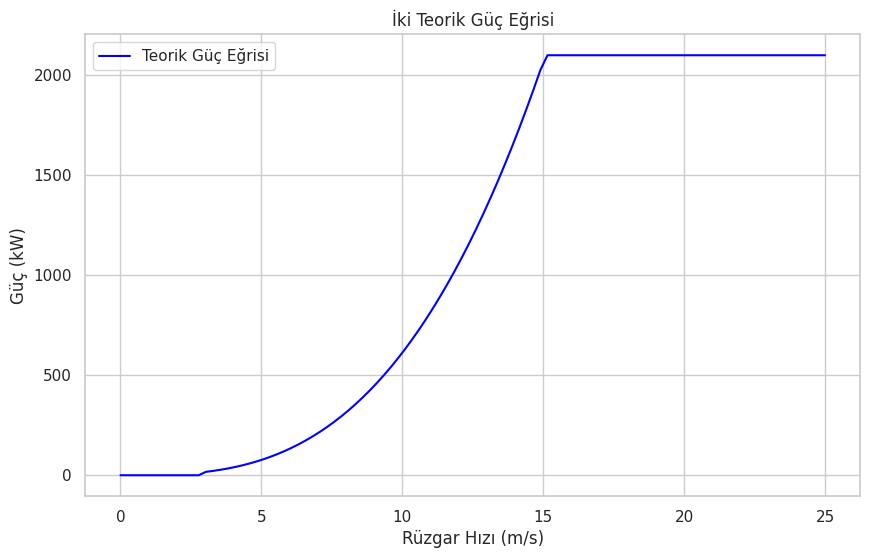

In [598]:
# prompt: her iki fonskiyonu çiz

plt.figure(figsize=(10, 6))

# TeorikGucEgrisi fonksiyonunu çiz
ruzgar_hizlari = np.linspace(0, 25, 100)
guc = TeorikGucEgrisi(ruzgar_hizlari)
plt.plot(ruzgar_hizlari, guc, label='Teorik Güç Eğrisi', color='blue')

plt.title('İki Teorik Güç Eğrisi')
plt.xlabel('Rüzgar Hızı (m/s)')
plt.ylabel('Güç (kW)')
plt.grid(True)
plt.legend()
plt.show()

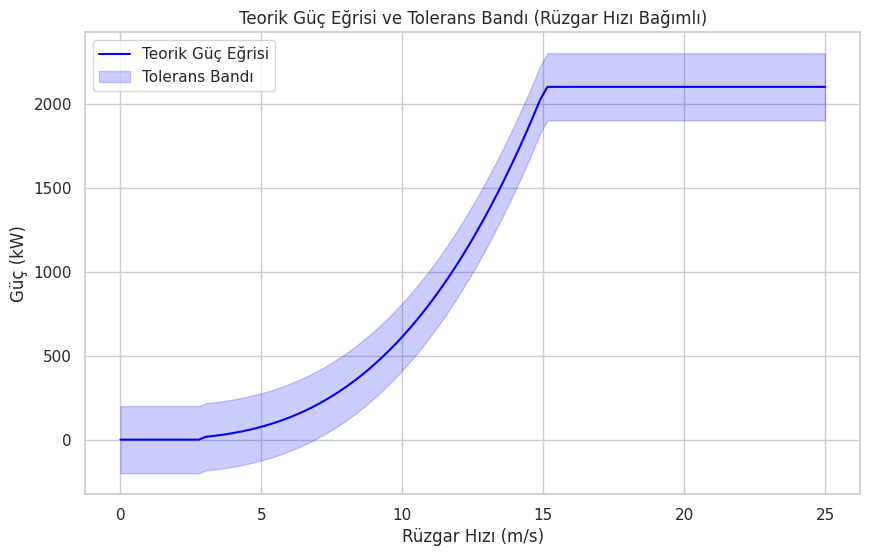

In [599]:
# prompt: rüzgar hızı 15 ten küçükse tolerans 20, büyükse 10 olsun çiz

plt.figure(figsize=(10, 6))

# TeorikGucEgrisi fonksiyonunu çiz
ruzgar_hizlari = np.linspace(0, 25, 100)
guc = TeorikGucEgrisi(ruzgar_hizlari)
plt.plot(ruzgar_hizlari, guc, label='Teorik Güç Eğrisi', color='blue')

# Tolerans bandı oluşturma
tolerans = np.where(ruzgar_hizlari < 15, 200, 200)  # Rüzgar hızı 15'ten küçükse tolerans 20, büyükse 10
ust_sinir = guc + tolerans
alt_sinir = guc - tolerans

# Tolerans bandını çiz
plt.fill_between(ruzgar_hizlari, alt_sinir, ust_sinir, color='blue', alpha=0.2, label='Tolerans Bandı')

plt.title('Teorik Güç Eğrisi ve Tolerans Bandı (Rüzgar Hızı Bağımlı)')
plt.xlabel('Rüzgar Hızı (m/s)')
plt.ylabel('Güç (kW)')
plt.grid(True)
plt.legend()
plt.show()

Tolerans bandı içindeki veri:
                           Amb_WindSpeed_Max  Grd_Prod_Pwr_Max
Timestamp                                                     
2016-01-01 00:00:00+00:00                8.6             368.9
2016-01-01 00:30:00+00:00                9.4             581.2
2016-01-01 01:00:00+00:00                8.5             437.1
2016-01-01 01:10:00+00:00                7.7             276.7
2016-01-01 01:20:00+00:00                8.8             347.0
...                                      ...               ...
2016-12-31 20:50:00+00:00               11.6             913.2
2016-12-31 21:30:00+00:00               10.4             708.5
2016-12-31 21:40:00+00:00               11.1             913.0
2016-12-31 22:20:00+00:00               10.8             799.2
2016-12-31 22:30:00+00:00               10.5             758.4

[20905 rows x 2 columns]


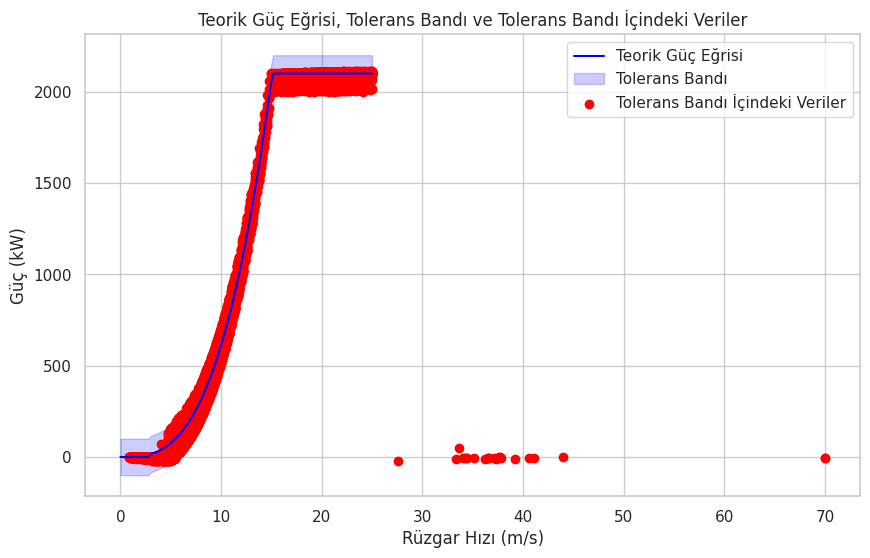

In [600]:
# prompt: tolerans bandının içerisindeki verileri seç

# Tolerans bandı içindeki verileri seçme
tolerans = 100  # Tolerans değeri
filtered_data_within_band = filtered_data_iqr[
    (filtered_data_iqr['Grd_Prod_Pwr_Max'] >= TeorikGucEgrisi(filtered_data_iqr['Amb_WindSpeed_Max']) - tolerans) &
    (filtered_data_iqr['Grd_Prod_Pwr_Max'] <= TeorikGucEgrisi(filtered_data_iqr['Amb_WindSpeed_Max']) + tolerans)
]

# Sonuçları görüntüleme
print("Tolerans bandı içindeki veri:")
print(filtered_data_within_band)

# Tolerans bandı içindeki verileri çiz
plt.figure(figsize=(10, 6))

# TeorikGucEgrisi fonksiyonunu çiz
ruzgar_hizlari = np.linspace(0, 25, 100)
guc = TeorikGucEgrisi(ruzgar_hizlari)
plt.plot(ruzgar_hizlari, guc, label='Teorik Güç Eğrisi', color='blue')

# Tolerans bandını çiz
ust_sinir = guc + tolerans
alt_sinir = guc - tolerans
plt.fill_between(ruzgar_hizlari, alt_sinir, ust_sinir, color='blue', alpha=0.2, label='Tolerans Bandı')

# Tolerans bandı içindeki verileri çiz
plt.scatter(filtered_data_within_band['Amb_WindSpeed_Max'], filtered_data_within_band['Grd_Prod_Pwr_Max'], color='red', label='Tolerans Bandı İçindeki Veriler')

plt.title('Teorik Güç Eğrisi, Tolerans Bandı ve Tolerans Bandı İçindeki Veriler')
plt.xlabel('Rüzgar Hızı (m/s)')
plt.ylabel('Güç (kW)')
plt.grid(True)
plt.legend()
plt.show()

final_df=filtered_data_within_band

In [601]:
ddf=final_df.copy()

In [602]:
# prompt: max wind speed > 15 ve max power output< 3000 olan NF verilerini temizle
ddf = ddf.drop(ddf[(ddf['Amb_WindSpeed_Max'] > 25) & (ddf.iloc[:, -1] == 'NF')].index)
ddf = ddf.drop(ddf[(ddf['Grd_Prod_Pwr_Max'] <= 0) & (ddf.iloc[:, -1] == 'NF')].index)
ddf = ddf.drop(ddf[(ddf['Grd_Prod_Pwr_Max'] > 2200) & (ddf.iloc[:, -1] == 'NF')].index)


In [603]:
# prompt: Amb_WindSpeed_Max değeri 25 ten büyük olan verileri temizle

ddf = ddf[~(ddf['Amb_WindSpeed_Max'] > 25)]
# prompt: ddf Amb_WindSpeed_Max Grd_Prod_Pwr_Max grafiğini plotly kullanarak çiz

import plotly.express as px

fig = px.scatter(ddf, x='Amb_WindSpeed_Max', y='Grd_Prod_Pwr_Max', title='Amb_WindSpeed_Max vs Grd_Prod_Pwr_Max')
fig.show()

In [604]:
# prompt: dd verisetindeki index değerlerininden ddf index değerlerinde eşit olan satırları seç

# Assuming 'dd' and 'ddf' are your DataFrames
# Find the common indices between dd and ddf
common_indices = dd.index.intersection(ddf.index)

# Select rows from 'dd' that have the same index values as in 'ddf'
data = dd.loc[common_indices]

# Print the selected rows from 'dd'
print(data)

                           Gen_RPM_Max  Gen_RPM_Min  Gen_RPM_Avg  Gen_RPM_Std  \
Timestamp                                                                       
2016-01-01 00:00:00+00:00       1339.4       1233.3       1270.9         18.8   
2016-01-01 00:30:00+00:00       1470.1       1258.7       1377.5         48.9   
2016-01-01 01:00:00+00:00       1401.2       1238.4       1280.6         27.9   
2016-01-01 01:10:00+00:00       1293.3       1235.6       1257.1         10.9   
2016-01-01 01:20:00+00:00       1311.8       1231.4       1268.8         16.7   
...                                ...          ...          ...          ...   
2016-12-31 20:50:00+00:00       1639.0       1335.6       1535.0         63.5   
2016-12-31 21:30:00+00:00       1571.8       1354.4       1450.3         43.7   
2016-12-31 21:40:00+00:00       1613.9       1331.2       1498.2         65.1   
2016-12-31 22:20:00+00:00       1592.3       1330.5       1476.5         57.8   
2016-12-31 22:30:00+00:00   

In [605]:
#data=dd    # filtresiz

In [606]:
# prompt: data veri setine dd veri setinin GF ve HF satırlarını ilave et

# Assuming 'dd' is your DataFrame
# Create a new DataFrame with 'GF' and 'HF' rows from 'dd'
dd_GF_HF = dd[dd['Fault'].isin(['GF', 'HF'])]

# Concatenate 'data' and 'dd_GF_HF' to create a combined DataFrame
data = pd.concat([data, dd_GF_HF])



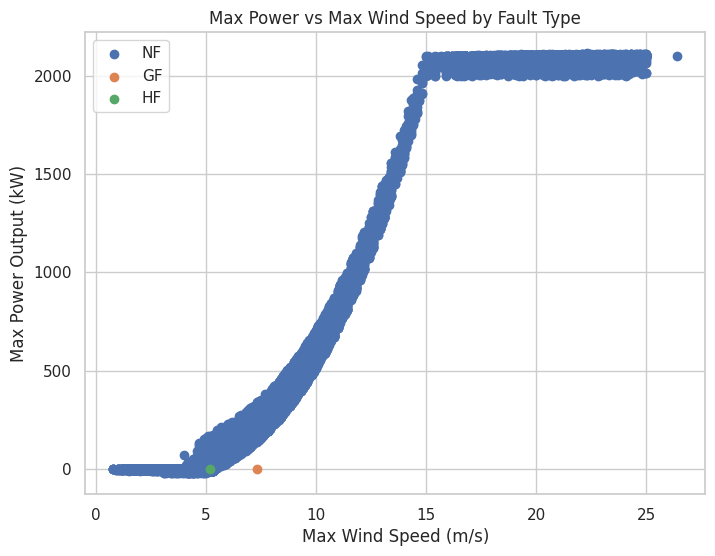

In [607]:
plt.figure(figsize=(8, 6))
for fault in data['Fault'].unique():
  subset = data[data['Fault'] == fault]
  plt.scatter(subset['Amb_WindSpeed_Max'], subset['Grd_Prod_Pwr_Max'], label=fault)

plt.xlabel('Max Wind Speed (m/s)')
plt.ylabel('Max Power Output (kW)')
plt.title('Max Power vs Max Wind Speed by Fault Type')
plt.legend()
plt.grid(True)
plt.show()

In [608]:
data = data[data['Fault'].isin([fau, 'NF'])]


In [609]:
# Calculate the count of each fault class
fault_counts = data['Fault'].value_counts()

# Print the counts
print(fault_counts)


Fault
NF    20881
GF        1
Name: count, dtype: int64


data_n1 = data[(data['DateTime_x'] >= '2014-05-10') & (data['DateTime_x'] <= '2014-05-14 14:30:00	')]
data_n2 = data[(data['DateTime_x'] >= '2014-10-13') & (data['DateTime_x'] <= '2014-10-17 11:30:00	')]
data_n3 = data[(data['DateTime_x'] >= '2014-10-22') & (data['DateTime_x'] <= '2014-10-26 18:00:00	')]
data_n4 = data[(data['DateTime_x'] >= '2015-01-03') & (data['DateTime_x'] <= '2015-01-07 18:00:00	')]

In [610]:
#data = data.drop('WEC: Production kWh', axis=1)
#data=data.drop('WEC: min. Power',axis=1)
#data=data.drop('WEC: ava. available P from wind',axis=1)
#data=data.drop('RTU: ava. Setpoint 1',axis=1)
#data_nf = data[data.Fault == 'NF'].sample(40000, random_state = 123)
data_nf=data[data.Fault == 'NF']
data_allF = data[data.Fault != 'NF']


In [611]:
data=data.sort_index()

In [612]:
data

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,1339.4,1233.3,1270.9,18.8,42,59,61,60,30,48,...,-752.6,-1000.0,56.5,973.4,1000.0,752.6,56.5,38,206.9,NF
2016-01-01 00:30:00+00:00,1470.1,1258.7,1377.5,48.9,43,60,62,61,30,49,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,206.9,NF
2016-01-01 01:00:00+00:00,1401.2,1238.4,1280.6,27.9,44,61,62,61,30,50,...,-502.3,-1000.0,135.0,932.2,1000.0,502.3,135.0,39,206.9,NF
2016-01-01 01:10:00+00:00,1293.3,1235.6,1257.1,10.9,44,61,62,61,30,49,...,-413.6,-1000.0,122.8,939.3,1000.0,413.6,122.8,39,206.9,NF
2016-01-01 01:20:00+00:00,1311.8,1231.4,1268.8,16.7,43,60,62,61,30,49,...,-389.9,-1000.0,168.6,900.1,1000.0,389.9,168.6,39,206.9,NF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 20:50:00+00:00,1639.0,1335.6,1535.0,63.5,41,59,60,60,28,54,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,39,101.8,NF
2016-12-31 21:30:00+00:00,1571.8,1354.4,1450.3,43.7,41,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,NF
2016-12-31 21:40:00+00:00,1613.9,1331.2,1498.2,65.1,40,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,NF


In [613]:
#data=data.set_index('DateTime_x')
data=data.sort_index()
data

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,1339.4,1233.3,1270.9,18.8,42,59,61,60,30,48,...,-752.6,-1000.0,56.5,973.4,1000.0,752.6,56.5,38,206.9,NF
2016-01-01 00:30:00+00:00,1470.1,1258.7,1377.5,48.9,43,60,62,61,30,49,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,206.9,NF
2016-01-01 01:00:00+00:00,1401.2,1238.4,1280.6,27.9,44,61,62,61,30,50,...,-502.3,-1000.0,135.0,932.2,1000.0,502.3,135.0,39,206.9,NF
2016-01-01 01:10:00+00:00,1293.3,1235.6,1257.1,10.9,44,61,62,61,30,49,...,-413.6,-1000.0,122.8,939.3,1000.0,413.6,122.8,39,206.9,NF
2016-01-01 01:20:00+00:00,1311.8,1231.4,1268.8,16.7,43,60,62,61,30,49,...,-389.9,-1000.0,168.6,900.1,1000.0,389.9,168.6,39,206.9,NF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 20:50:00+00:00,1639.0,1335.6,1535.0,63.5,41,59,60,60,28,54,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,39,101.8,NF
2016-12-31 21:30:00+00:00,1571.8,1354.4,1450.3,43.7,41,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,NF
2016-12-31 21:40:00+00:00,1613.9,1331.2,1498.2,65.1,40,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,NF


In [614]:

data_af=data
data_af = data_af.sort_index()
hdata=data_af['Fault'].replace('NF', 0, inplace=True)
hdata=data_af['Fault'].replace(fau, 1, inplace=True)


In [615]:
data_af

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,1339.4,1233.3,1270.9,18.8,42,59,61,60,30,48,...,-752.6,-1000.0,56.5,973.4,1000.0,752.6,56.5,38,206.9,0
2016-01-01 00:30:00+00:00,1470.1,1258.7,1377.5,48.9,43,60,62,61,30,49,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,206.9,0
2016-01-01 01:00:00+00:00,1401.2,1238.4,1280.6,27.9,44,61,62,61,30,50,...,-502.3,-1000.0,135.0,932.2,1000.0,502.3,135.0,39,206.9,0
2016-01-01 01:10:00+00:00,1293.3,1235.6,1257.1,10.9,44,61,62,61,30,49,...,-413.6,-1000.0,122.8,939.3,1000.0,413.6,122.8,39,206.9,0
2016-01-01 01:20:00+00:00,1311.8,1231.4,1268.8,16.7,43,60,62,61,30,49,...,-389.9,-1000.0,168.6,900.1,1000.0,389.9,168.6,39,206.9,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 20:50:00+00:00,1639.0,1335.6,1535.0,63.5,41,59,60,60,28,54,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,39,101.8,0
2016-12-31 21:30:00+00:00,1571.8,1354.4,1450.3,43.7,41,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,0
2016-12-31 21:40:00+00:00,1613.9,1331.2,1498.2,65.1,40,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,0


In [616]:
# prompt: 2014-11-28 16:30:00 tarihinden sonraki satırları temizle

#data_af = data_af[data_af.index <= '2015-01-11 09:00:00']


In [617]:
data_af

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,1339.4,1233.3,1270.9,18.8,42,59,61,60,30,48,...,-752.6,-1000.0,56.5,973.4,1000.0,752.6,56.5,38,206.9,0
2016-01-01 00:30:00+00:00,1470.1,1258.7,1377.5,48.9,43,60,62,61,30,49,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,206.9,0
2016-01-01 01:00:00+00:00,1401.2,1238.4,1280.6,27.9,44,61,62,61,30,50,...,-502.3,-1000.0,135.0,932.2,1000.0,502.3,135.0,39,206.9,0
2016-01-01 01:10:00+00:00,1293.3,1235.6,1257.1,10.9,44,61,62,61,30,49,...,-413.6,-1000.0,122.8,939.3,1000.0,413.6,122.8,39,206.9,0
2016-01-01 01:20:00+00:00,1311.8,1231.4,1268.8,16.7,43,60,62,61,30,49,...,-389.9,-1000.0,168.6,900.1,1000.0,389.9,168.6,39,206.9,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 20:50:00+00:00,1639.0,1335.6,1535.0,63.5,41,59,60,60,28,54,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,39,101.8,0
2016-12-31 21:30:00+00:00,1571.8,1354.4,1450.3,43.7,41,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,0
2016-12-31 21:40:00+00:00,1613.9,1331.2,1498.2,65.1,40,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,0


In [618]:
# prompt: duplikeleri sil

data_af = data_af[~data_af.index.duplicated(keep='first')]


In [619]:
data_af

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,1339.4,1233.3,1270.9,18.8,42,59,61,60,30,48,...,-752.6,-1000.0,56.5,973.4,1000.0,752.6,56.5,38,206.9,0
2016-01-01 00:30:00+00:00,1470.1,1258.7,1377.5,48.9,43,60,62,61,30,49,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,206.9,0
2016-01-01 01:00:00+00:00,1401.2,1238.4,1280.6,27.9,44,61,62,61,30,50,...,-502.3,-1000.0,135.0,932.2,1000.0,502.3,135.0,39,206.9,0
2016-01-01 01:10:00+00:00,1293.3,1235.6,1257.1,10.9,44,61,62,61,30,49,...,-413.6,-1000.0,122.8,939.3,1000.0,413.6,122.8,39,206.9,0
2016-01-01 01:20:00+00:00,1311.8,1231.4,1268.8,16.7,43,60,62,61,30,49,...,-389.9,-1000.0,168.6,900.1,1000.0,389.9,168.6,39,206.9,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 20:50:00+00:00,1639.0,1335.6,1535.0,63.5,41,59,60,60,28,54,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,39,101.8,0
2016-12-31 21:30:00+00:00,1571.8,1354.4,1450.3,43.7,41,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,0
2016-12-31 21:40:00+00:00,1613.9,1331.2,1498.2,65.1,40,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,0


In [620]:
data_afx= data_af.drop(columns=['Fault'])
data_afy=data_af['Fault']

In [621]:
data_afy

,Fault
Timestamp,
2016-01-01 00:00:00+00:00,0
2016-01-01 00:30:00+00:00,0
2016-01-01 01:00:00+00:00,0
2016-01-01 01:10:00+00:00,0
2016-01-01 01:20:00+00:00,0
...,...
2016-12-31 20:50:00+00:00,0
2016-12-31 21:30:00+00:00,0
2016-12-31 21:40:00+00:00,0


In [622]:
scaler1 = preprocessing.MinMaxScaler()

x_new = pd.DataFrame(scaler1.fit_transform(data_afx),
                              columns = data_afx.columns,
                              index = data_afx.index)

In [623]:
x_new

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Avg,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,0.721154,0.742013,0.755140,0.025144,0.328571,0.346154,0.368932,0.359223,0.25000,0.59375,...,0.0266,0.2474,0.0,0.115471,0.9734,1.0,0.7526,0.115471,0.339623,0.576205
2016-01-01 00:30:00+00:00,0.791525,0.757295,0.818479,0.065401,0.342857,0.355769,0.378641,0.368932,0.25000,0.62500,...,0.0000,0.0000,0.0,0.000000,1.0000,1.0,1.0000,0.000000,0.339623,0.576205
2016-01-01 01:00:00+00:00,0.754428,0.745082,0.760903,0.037314,0.357143,0.365385,0.378641,0.368932,0.25000,0.65625,...,0.0678,0.4977,0.0,0.275904,0.9322,1.0,0.5023,0.275904,0.358491,0.576205
2016-01-01 01:10:00+00:00,0.696333,0.743397,0.746940,0.014578,0.357143,0.365385,0.378641,0.368932,0.25000,0.62500,...,0.0607,0.5864,0.0,0.250971,0.9393,1.0,0.4136,0.250971,0.358491,0.576205
2016-01-01 01:20:00+00:00,0.706294,0.740870,0.753892,0.022335,0.342857,0.355769,0.378641,0.368932,0.25000,0.62500,...,0.0999,0.6101,0.0,0.344574,0.9001,1.0,0.3899,0.344574,0.358491,0.576205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 20:50:00+00:00,0.882464,0.803562,0.912062,0.084927,0.314286,0.346154,0.359223,0.359223,0.18750,0.78125,...,0.0000,0.0000,0.0,0.000000,1.0000,1.0,1.0000,0.000000,0.358491,0.283366
2016-12-31 21:30:00+00:00,0.846282,0.814873,0.861735,0.058446,0.314286,0.336538,0.349515,0.339806,0.15625,0.75000,...,0.0000,0.0000,0.0,0.000000,1.0000,1.0,1.0000,0.000000,0.339623,0.264698
2016-12-31 21:40:00+00:00,0.868950,0.800915,0.890196,0.087067,0.300000,0.336538,0.349515,0.339806,0.15625,0.75000,...,0.0000,0.0000,0.0,0.000000,1.0000,1.0,1.0000,0.000000,0.339623,0.264698


In [624]:
# prompt: Xgboost ile feature selection uygulka

import xgboost as xgb

# Create an XGBClassifier object
model = xgb.XGBClassifier()


# Fit the model to the data
model.fit(x_new, data_afy)

# Get the feature importances
importances = model.feature_importances_

# Create a dataframe with feature names and importances
feature_importances = pd.DataFrame({'feature': x_new.columns, 'importance': importances})

# Sort the dataframe by importance
feature_importances = feature_importances.sort_values('importance', ascending=False)

# Print the top 10 features
print(feature_importances.head(15))

# Select the top 10 features
selected_features_xgb = feature_importances['feature'][:15]


                        feature  importance
46    Grd_RtrInvPhase3_Temp_Avg    0.226839
3                   Gen_RPM_Std    0.220130
23    Prod_LatestAvg_ActPwrGen1    0.141040
26  Prod_LatestAvg_ReactPwrGen0    0.113513
19     Amb_WindDir_Relative_Avg    0.089232
65        Grd_Prod_ReactPwr_Min    0.078946
4             Gen_Bear_Temp_Avg    0.073336
66        Grd_Prod_ReactPwr_Std    0.056964
55        Grd_Prod_CurPhse2_Avg    0.000000
59          Grd_Busbar_Temp_Avg    0.000000
58             Grd_Prod_Pwr_Min    0.000000
57             Grd_Prod_Pwr_Max    0.000000
56        Grd_Prod_CurPhse3_Avg    0.000000
0                   Gen_RPM_Max    0.000000
54        Grd_Prod_CurPhse1_Avg    0.000000


In [625]:
# Ensure x_new and data_afy have the same number of rows
x_new = x_new.loc[data_afy.index]  # Select rows from x_new that match the index of data_afy

# Convert data_afy to a consistent data type (e.g., all integers)
data_afy = pd.to_numeric(data_afy, errors='coerce') # 'coerce' will replace invalid values with NaN

# If you have NaN values after conversion, handle them (e.g., drop rows or impute values)
# For this example, let's drop rows with NaNs
data_afy = data_afy.dropna()
x_new = x_new.loc[data_afy.index]  # Update x_new again after dropping NaNs from data_afy

# Create an XGBClassifier object
model = xgb.XGBClassifier()

# Fit the model to the data
model.fit(x_new, data_afy)

# Get the feature importances
importances = model.feature_importances_

# Create a dataframe with feature names and importances
feature_importances = pd.DataFrame({'feature': x_new.columns, 'importance': importances})

# Sort the dataframe by importance
feature_importances = feature_importances.sort_values('importance', ascending=False)

# Print the top 10 features
print(feature_importances.head(15))

# Select the top 10 features
selected_features_xgb = feature_importances['feature'][:15]

                        feature  importance
46    Grd_RtrInvPhase3_Temp_Avg    0.226839
3                   Gen_RPM_Std    0.220130
23    Prod_LatestAvg_ActPwrGen1    0.141040
26  Prod_LatestAvg_ReactPwrGen0    0.113513
19     Amb_WindDir_Relative_Avg    0.089232
65        Grd_Prod_ReactPwr_Min    0.078946
4             Gen_Bear_Temp_Avg    0.073336
66        Grd_Prod_ReactPwr_Std    0.056964
55        Grd_Prod_CurPhse2_Avg    0.000000
59          Grd_Busbar_Temp_Avg    0.000000
58             Grd_Prod_Pwr_Min    0.000000
57             Grd_Prod_Pwr_Max    0.000000
56        Grd_Prod_CurPhse3_Avg    0.000000
0                   Gen_RPM_Max    0.000000
54        Grd_Prod_CurPhse1_Avg    0.000000


In [626]:
# prompt: feature selection threshold 0.02 nin altındakileri çıkart

# Filter features with importance greater than 0.02
selected_features_xgb = feature_importances[feature_importances['importance'] > 0.09]['feature']
dim=len(selected_features_xgb)
dim

4

In [627]:
# prompt: kaç adet olduğunu belirle

len(selected_features_xgb)


4

In [628]:
# prompt: Dense-Net kullanarak feature selection yap
'''

from keras.layers import Dense
from keras.models import Sequential
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(x_new, data_afy, test_size=0.2, random_state=42)

# Define the Dense-Net model
model = Sequential()
model.add(Dense(64, activation='tanh', input_shape=(x_new.shape[1],)))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=20, batch_size=32)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print('Test accuracy:', accuracy)

# Get the feature importances from the trained model
importances = model.layers[0].get_weights()[0]
feature_importances = pd.DataFrame({'feature': x_new.columns, 'importance': np.mean(np.abs(importances), axis=1)})
feature_importances = feature_importances.sort_values('importance', ascending=False)

# Print the top 10 features
print(feature_importances.head(15))

# Select the top 10 features
selected_features_dense = feature_importances['feature'][:15]

'''

"\n\nfrom keras.layers import Dense\nfrom keras.models import Sequential\nfrom sklearn.model_selection import train_test_split\n\n# Split the data into training and testing sets\nX_train, X_test, y_train, y_test = train_test_split(x_new, data_afy, test_size=0.2, random_state=42)\n\n# Define the Dense-Net model\nmodel = Sequential()\nmodel.add(Dense(64, activation='tanh', input_shape=(x_new.shape[1],)))\nmodel.add(Dense(32, activation='relu'))\nmodel.add(Dense(1, activation='sigmoid'))\n\n# Compile the model\nmodel.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])\n\n# Train the model\nmodel.fit(X_train, y_train, epochs=20, batch_size=32)\n\n# Evaluate the model\nloss, accuracy = model.evaluate(X_test, y_test)\nprint('Test accuracy:', accuracy)\n\n# Get the feature importances from the trained model\nimportances = model.layers[0].get_weights()[0]\nfeature_importances = pd.DataFrame({'feature': x_new.columns, 'importance': np.mean(np.abs(importances), axis=1)})\

In [629]:
my_dict = {}
my_list = selected_features_xgb          #kbest             common_selected               #my_list = selectlist
my_tuple = tuple(my_list)
my_dict[my_tuple] = "value"
my_tuple

('Grd_RtrInvPhase3_Temp_Avg',
 'Gen_RPM_Std',
 'Prod_LatestAvg_ActPwrGen1',
 'Prod_LatestAvg_ReactPwrGen0')

In [630]:
my_list

,feature
46,Grd_RtrInvPhase3_Temp_Avg
3,Gen_RPM_Std
23,Prod_LatestAvg_ActPwrGen1
26,Prod_LatestAvg_ReactPwrGen0


In [631]:
x_new = x_new.reindex(columns = my_tuple)
x_new['Fault']=data_af['Fault']
data_af=x_new
corr_matrixx = data_af.corr()
corr_matrixx['Fault'].sort_values(ascending=False)

,Fault
Fault,1.000000
Gen_RPM_Std,0.025587
Prod_LatestAvg_ReactPwrGen0,-0.000585
Prod_LatestAvg_ActPwrGen1,-0.005786
Grd_RtrInvPhase3_Temp_Avg,-0.012418


In [632]:
data_af

,Grd_RtrInvPhase3_Temp_Avg,Gen_RPM_Std,Prod_LatestAvg_ActPwrGen1,Prod_LatestAvg_ReactPwrGen0,Fault
Timestamp,,,,,
2016-01-01 00:00:00+00:00,0.366667,0.025144,0.123792,0.878939,0
2016-01-01 00:30:00+00:00,0.366667,0.065401,0.232810,0.878939,0
2016-01-01 01:00:00+00:00,0.366667,0.037314,0.127659,0.878939,0
2016-01-01 01:10:00+00:00,0.366667,0.014578,0.104319,0.878939,0
2016-01-01 01:20:00+00:00,0.366667,0.022335,0.105893,0.878939,0
...,...,...,...,...,...
2016-12-31 20:50:00+00:00,0.400000,0.084927,0.332178,0.878939,0
2016-12-31 21:30:00+00:00,0.400000,0.058446,0.263671,0.878939,0
2016-12-31 21:40:00+00:00,0.400000,0.087067,0.319986,0.878939,0


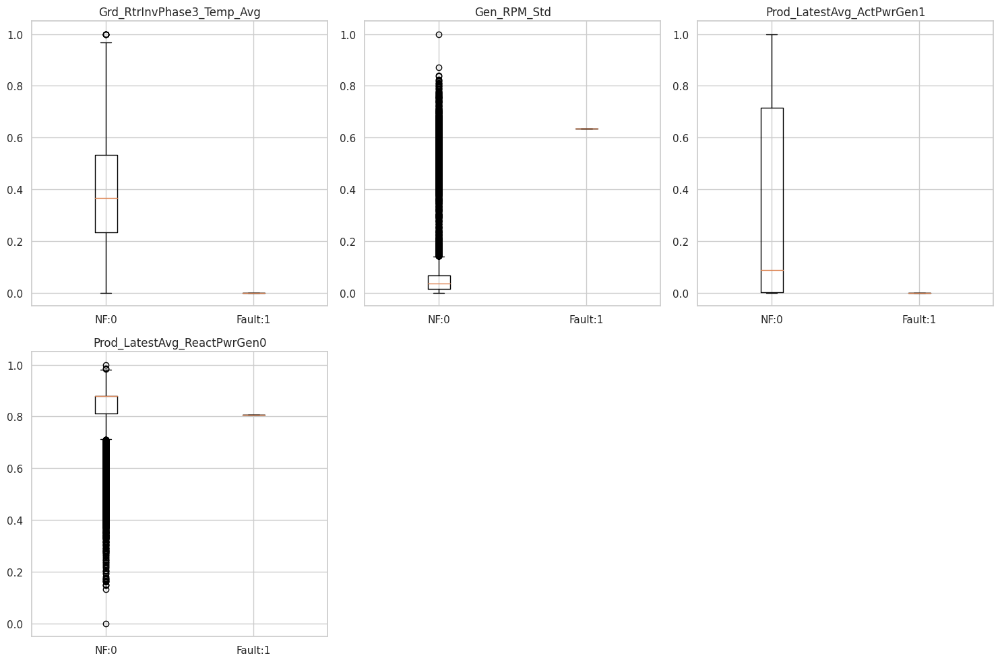

In [633]:
features = selected_features_xgb
ddf=data_af.copy()

# Filter the data for NF and EF
data_nf = ddf[ddf['Fault'] == 0][features]
data_ef = ddf[ddf['Fault'] == 1][features]

# Create box plots for each feature
plt.figure(figsize=(15, 10))

# Calculate the number of rows and columns for subplots
num_rows = int(len(features) / 3) + (len(features) % 3 > 0)  # Calculate the number of rows needed

for i, feature in enumerate(features):
  plt.subplot(num_rows, 3, i + 1) # Use num_rows to create enough subplots
  plt.boxplot([data_nf[feature], data_ef[feature]], labels=['NF:0', 'Fault:1'])
  plt.title(feature)

plt.tight_layout()
plt.show()

In [634]:
# prompt: data_nf remove outliers

# Sadece NF verilerini al
nf_data = data_af[data_af['Fault'] == 0]

# Her sütun için boxplot çiz ve aykırı değerleri tespit et
for column in nf_data.columns[:-1]:  # Son sütun 'Fault', onu hariç tutuyoruz
  if nf_data[column].dtype != 'datetime64[ns]': #Datetime columns cannot be processed by boxplot


    # IQR kullanarak aykırı değerleri tespit et
    Q1 = nf_data[column].quantile(0.25)
    Q3 = nf_data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Aykırı değerleri filtrele
    nf_data = nf_data[(nf_data[column] >= lower_bound) & (nf_data[column] <= upper_bound)]


# Temizlenmiş NF verilerini ddf'ye geri ata
data_af = pd.concat([data_af[data_af['Fault'] != 0], nf_data]) # Changed append to concat

data_af=data_af.sort_index()


In [635]:
# prompt: remove ef_data outliers

# Sadece EF verilerini al
ef_data = data_af[data_af['Fault'] == 1]

# Her sütun için boxplot çiz ve aykırı değerleri tespit et
for column in ef_data.columns[:-1]:  # Son sütun 'Fault', onu hariç tutuyoruz
  if ef_data[column].dtype != 'datetime64[ns]': #Datetime columns cannot be processed by boxplot


    # IQR kullanarak aykırı değerleri tespit et
    Q1 = ef_data[column].quantile(0.25)
    Q3 = ef_data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Aykırı değerleri filtrele
    ef_data = ef_data[(ef_data[column] >= lower_bound) & (ef_data[column] <= upper_bound)]


# Temizlenmiş EF verilerini data_af'ye geri ata
data_af = pd.concat([data_af[data_af['Fault'] != 1], ef_data]) # Changed append to concat

data_af=data_af.sort_index()


In [636]:
data_af

,Grd_RtrInvPhase3_Temp_Avg,Gen_RPM_Std,Prod_LatestAvg_ActPwrGen1,Prod_LatestAvg_ReactPwrGen0,Fault
Timestamp,,,,,
2016-01-01 00:00:00+00:00,0.366667,0.025144,0.123792,0.878939,0
2016-01-01 00:30:00+00:00,0.366667,0.065401,0.232810,0.878939,0
2016-01-01 01:00:00+00:00,0.366667,0.037314,0.127659,0.878939,0
2016-01-01 01:10:00+00:00,0.366667,0.014578,0.104319,0.878939,0
2016-01-01 01:20:00+00:00,0.366667,0.022335,0.105893,0.878939,0
...,...,...,...,...,...
2016-12-31 20:50:00+00:00,0.400000,0.084927,0.332178,0.878939,0
2016-12-31 21:30:00+00:00,0.400000,0.058446,0.263671,0.878939,0
2016-12-31 21:40:00+00:00,0.400000,0.087067,0.319986,0.878939,0


In [637]:
# prompt: data_af features rolling lerini al

# Assuming you want to calculate rolling features for the selected features
rolling_window = 10  # Define the rolling window size

for feature in selected_features_xgb:
  # Calculate the rolling mean
  data_af[f'{feature}_rolling_mean'] = data_af[feature].rolling(window=rolling_window, center=True).mean()

  # Calculate the rolling standard deviation
  data_af[f'{feature}_rolling_std'] = data_af[feature].rolling(window=rolling_window, center=True).std()

  # Calculate the rolling max
  data_af[f'{feature}_rolling_max'] = data_af[feature].rolling(window=rolling_window, center=True).max()

  # Calculate the rolling min
  data_af[f'{feature}_rolling_min'] = data_af[feature].rolling(window=rolling_window, center=True).min()

# Now, data_af contains the rolling mean, standard deviation, max, and min for each selected feature.
print(data_af.head())

                           Grd_RtrInvPhase3_Temp_Avg  Gen_RPM_Std  \
Timestamp                                                           
2016-01-01 00:00:00+00:00                   0.366667     0.025144   
2016-01-01 00:30:00+00:00                   0.366667     0.065401   
2016-01-01 01:00:00+00:00                   0.366667     0.037314   
2016-01-01 01:10:00+00:00                   0.366667     0.014578   
2016-01-01 01:20:00+00:00                   0.366667     0.022335   

                           Prod_LatestAvg_ActPwrGen1  \
Timestamp                                              
2016-01-01 00:00:00+00:00                   0.123792   
2016-01-01 00:30:00+00:00                   0.232810   
2016-01-01 01:00:00+00:00                   0.127659   
2016-01-01 01:10:00+00:00                   0.104319   
2016-01-01 01:20:00+00:00                   0.105893   

                           Prod_LatestAvg_ReactPwrGen0  Fault  \
Timestamp                                                 

In [661]:
# prompt: Nan değerleri olmasın

data_af = data_af.fillna(method='ffill').fillna(method='bfill')

In [665]:
# prompt: data_af de Fault sütununu en sağa

# Move 'Fault' column to the rightmost position
cols = list(data_af.columns)
cols.remove('Fault')
cols.append('Fault')
data_af = data_af[cols]


In [668]:
data_af


,Grd_RtrInvPhase3_Temp_Avg,Gen_RPM_Std,Prod_LatestAvg_ActPwrGen1,Prod_LatestAvg_ReactPwrGen0,Grd_RtrInvPhase3_Temp_Avg_rolling_mean,Grd_RtrInvPhase3_Temp_Avg_rolling_std,Grd_RtrInvPhase3_Temp_Avg_rolling_max,Grd_RtrInvPhase3_Temp_Avg_rolling_min,Gen_RPM_Std_rolling_mean,Gen_RPM_Std_rolling_std,...,Gen_RPM_Std_rolling_min,Prod_LatestAvg_ActPwrGen1_rolling_mean,Prod_LatestAvg_ActPwrGen1_rolling_std,Prod_LatestAvg_ActPwrGen1_rolling_max,Prod_LatestAvg_ActPwrGen1_rolling_min,Prod_LatestAvg_ReactPwrGen0_rolling_mean,Prod_LatestAvg_ReactPwrGen0_rolling_std,Prod_LatestAvg_ReactPwrGen0_rolling_max,Prod_LatestAvg_ReactPwrGen0_rolling_min,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,0.366667,0.025144,0.123792,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
2016-01-01 00:30:00+00:00,0.366667,0.065401,0.232810,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
2016-01-01 01:00:00+00:00,0.366667,0.037314,0.127659,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
2016-01-01 01:10:00+00:00,0.366667,0.014578,0.104319,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
2016-01-01 01:20:00+00:00,0.366667,0.022335,0.105893,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 20:50:00+00:00,0.400000,0.084927,0.332178,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,...,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.000000,0.878939,0.878939,0
2016-12-31 21:30:00+00:00,0.400000,0.058446,0.263671,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,...,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.000000,0.878939,0.878939,0
2016-12-31 21:40:00+00:00,0.400000,0.087067,0.319986,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,...,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.000000,0.878939,0.878939,0


In [669]:
data_af[data_af['Fault'] != 0]

,Grd_RtrInvPhase3_Temp_Avg,Gen_RPM_Std,Prod_LatestAvg_ActPwrGen1,Prod_LatestAvg_ReactPwrGen0,Grd_RtrInvPhase3_Temp_Avg_rolling_mean,Grd_RtrInvPhase3_Temp_Avg_rolling_std,Grd_RtrInvPhase3_Temp_Avg_rolling_max,Grd_RtrInvPhase3_Temp_Avg_rolling_min,Gen_RPM_Std_rolling_mean,Gen_RPM_Std_rolling_std,...,Gen_RPM_Std_rolling_min,Prod_LatestAvg_ActPwrGen1_rolling_mean,Prod_LatestAvg_ActPwrGen1_rolling_std,Prod_LatestAvg_ActPwrGen1_rolling_max,Prod_LatestAvg_ActPwrGen1_rolling_min,Prod_LatestAvg_ReactPwrGen0_rolling_mean,Prod_LatestAvg_ReactPwrGen0_rolling_std,Prod_LatestAvg_ReactPwrGen0_rolling_max,Prod_LatestAvg_ReactPwrGen0_rolling_min,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-03-03 19:20:00+00:00,0.0,0.633677,0.0,0.806799,0.123333,0.11005,0.233333,0.0,0.086452,0.19292,...,0.0,0.043192,0.048049,0.127773,0.0,0.865285,0.036982,0.938917,0.806799,1


In [670]:
# prompt: 2014-12-09 01:49:00	tarihinden itibaren test verisi olsun

# test_date = '2016-10-08T23:00:00+00:00'

# trainhy = data_af[data_af.index < test_date]
# testhy = data_af[data_af.index >= test_date]




In [671]:
data_af


,Grd_RtrInvPhase3_Temp_Avg,Gen_RPM_Std,Prod_LatestAvg_ActPwrGen1,Prod_LatestAvg_ReactPwrGen0,Grd_RtrInvPhase3_Temp_Avg_rolling_mean,Grd_RtrInvPhase3_Temp_Avg_rolling_std,Grd_RtrInvPhase3_Temp_Avg_rolling_max,Grd_RtrInvPhase3_Temp_Avg_rolling_min,Gen_RPM_Std_rolling_mean,Gen_RPM_Std_rolling_std,...,Gen_RPM_Std_rolling_min,Prod_LatestAvg_ActPwrGen1_rolling_mean,Prod_LatestAvg_ActPwrGen1_rolling_std,Prod_LatestAvg_ActPwrGen1_rolling_max,Prod_LatestAvg_ActPwrGen1_rolling_min,Prod_LatestAvg_ReactPwrGen0_rolling_mean,Prod_LatestAvg_ReactPwrGen0_rolling_std,Prod_LatestAvg_ReactPwrGen0_rolling_max,Prod_LatestAvg_ReactPwrGen0_rolling_min,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,0.366667,0.025144,0.123792,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
2016-01-01 00:30:00+00:00,0.366667,0.065401,0.232810,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
2016-01-01 01:00:00+00:00,0.366667,0.037314,0.127659,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
2016-01-01 01:10:00+00:00,0.366667,0.014578,0.104319,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
2016-01-01 01:20:00+00:00,0.366667,0.022335,0.105893,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 20:50:00+00:00,0.400000,0.084927,0.332178,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,...,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.000000,0.878939,0.878939,0
2016-12-31 21:30:00+00:00,0.400000,0.058446,0.263671,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,...,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.000000,0.878939,0.878939,0
2016-12-31 21:40:00+00:00,0.400000,0.087067,0.319986,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,...,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.000000,0.878939,0.878939,0


In [672]:
# prompt: Fault=1 olan tarihten 5 gün önceye git

# Find the index of the row where Fault = 1
fault_index = data_af[data_af['Fault'] == 1].index[0]

# Calculate the date 5 days before the Fault = 1 date
before = fault_index - pd.Timedelta(days=10)

# Print the calculated date
print(before)

# Now you can use this date to split your data into train and test sets.
trainhy = data_af[data_af.index < before]
testhy = data_af[data_af.index >= before]

2016-02-22 19:20:00+00:00


In [673]:
trainhy

,Grd_RtrInvPhase3_Temp_Avg,Gen_RPM_Std,Prod_LatestAvg_ActPwrGen1,Prod_LatestAvg_ReactPwrGen0,Grd_RtrInvPhase3_Temp_Avg_rolling_mean,Grd_RtrInvPhase3_Temp_Avg_rolling_std,Grd_RtrInvPhase3_Temp_Avg_rolling_max,Grd_RtrInvPhase3_Temp_Avg_rolling_min,Gen_RPM_Std_rolling_mean,Gen_RPM_Std_rolling_std,...,Gen_RPM_Std_rolling_min,Prod_LatestAvg_ActPwrGen1_rolling_mean,Prod_LatestAvg_ActPwrGen1_rolling_std,Prod_LatestAvg_ActPwrGen1_rolling_max,Prod_LatestAvg_ActPwrGen1_rolling_min,Prod_LatestAvg_ReactPwrGen0_rolling_mean,Prod_LatestAvg_ReactPwrGen0_rolling_std,Prod_LatestAvg_ReactPwrGen0_rolling_max,Prod_LatestAvg_ReactPwrGen0_rolling_min,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,0.366667,0.025144,0.123792,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
2016-01-01 00:30:00+00:00,0.366667,0.065401,0.232810,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
2016-01-01 01:00:00+00:00,0.366667,0.037314,0.127659,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
2016-01-01 01:10:00+00:00,0.366667,0.014578,0.104319,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
2016-01-01 01:20:00+00:00,0.366667,0.022335,0.105893,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-02-22 14:50:00+00:00,0.400000,0.049084,0.168067,0.878939,0.230000,0.154320,0.400000,0.033333,0.026789,0.018320,...,0.005751,0.052433,0.071917,0.187924,0.000913,0.858872,0.021347,0.878939,0.832228,0
2016-02-22 17:10:00+00:00,0.366667,0.019125,0.086560,0.878939,0.260000,0.148074,0.400000,0.033333,0.026775,0.018329,...,0.005751,0.065024,0.072909,0.187924,0.000913,0.862687,0.021165,0.878939,0.832228,0
2016-02-22 17:40:00+00:00,0.366667,0.056573,0.187924,0.878939,0.290000,0.134302,0.400000,0.033333,0.027698,0.017758,...,0.005751,0.077118,0.071101,0.187924,0.000913,0.866501,0.020197,0.878939,0.832228,0


In [674]:
#percent = round(len(data_af) - len(data_af)*perc)
#trainhy = data_af.iloc[ :percent, :]

#testhy= data_af.iloc[percent: ,:]

In [675]:
testhy

,Grd_RtrInvPhase3_Temp_Avg,Gen_RPM_Std,Prod_LatestAvg_ActPwrGen1,Prod_LatestAvg_ReactPwrGen0,Grd_RtrInvPhase3_Temp_Avg_rolling_mean,Grd_RtrInvPhase3_Temp_Avg_rolling_std,Grd_RtrInvPhase3_Temp_Avg_rolling_max,Grd_RtrInvPhase3_Temp_Avg_rolling_min,Gen_RPM_Std_rolling_mean,Gen_RPM_Std_rolling_std,...,Gen_RPM_Std_rolling_min,Prod_LatestAvg_ActPwrGen1_rolling_mean,Prod_LatestAvg_ActPwrGen1_rolling_std,Prod_LatestAvg_ActPwrGen1_rolling_max,Prod_LatestAvg_ActPwrGen1_rolling_min,Prod_LatestAvg_ReactPwrGen0_rolling_mean,Prod_LatestAvg_ReactPwrGen0_rolling_std,Prod_LatestAvg_ReactPwrGen0_rolling_max,Prod_LatestAvg_ReactPwrGen0_rolling_min,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-02-22 20:10:00+00:00,0.366667,0.015648,0.126818,0.878939,0.370000,0.010541,0.400000,0.366667,0.022750,0.017813,...,0.005751,0.100459,0.054779,0.187924,0.038238,0.878939,0.0,0.878939,0.878939,0
2016-02-22 20:40:00+00:00,0.366667,0.021800,0.121856,0.878939,0.363333,0.010541,0.366667,0.333333,0.018229,0.016035,...,0.003879,0.086596,0.053290,0.187924,0.029437,0.878939,0.0,0.878939,0.878939,0
2016-02-22 20:50:00+00:00,0.366667,0.032500,0.131726,0.878939,0.363333,0.010541,0.366667,0.333333,0.016691,0.016664,...,0.003745,0.081831,0.055383,0.187924,0.029437,0.878939,0.0,0.878939,0.878939,0
2016-02-22 21:20:00+00:00,0.366667,0.009897,0.061022,0.878939,0.366667,0.015713,0.400000,0.333333,0.011248,0.009569,...,0.002140,0.064390,0.044690,0.131726,0.013515,0.878939,0.0,0.878939,0.878939,0
2016-02-22 21:30:00+00:00,0.366667,0.007623,0.043401,0.878939,0.366667,0.015713,0.400000,0.333333,0.010606,0.009909,...,0.002140,0.063556,0.045306,0.131726,0.013515,0.878939,0.0,0.878939,0.878939,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 20:50:00+00:00,0.400000,0.084927,0.332178,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,...,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.0,0.878939,0.878939,0
2016-12-31 21:30:00+00:00,0.400000,0.058446,0.263671,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,...,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.0,0.878939,0.878939,0
2016-12-31 21:40:00+00:00,0.400000,0.087067,0.319986,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,...,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.0,0.878939,0.878939,0


In [676]:
# prompt: testhy fault 1 olanları göster

testhy[testhy['Fault'] == 1]


,Grd_RtrInvPhase3_Temp_Avg,Gen_RPM_Std,Prod_LatestAvg_ActPwrGen1,Prod_LatestAvg_ReactPwrGen0,Grd_RtrInvPhase3_Temp_Avg_rolling_mean,Grd_RtrInvPhase3_Temp_Avg_rolling_std,Grd_RtrInvPhase3_Temp_Avg_rolling_max,Grd_RtrInvPhase3_Temp_Avg_rolling_min,Gen_RPM_Std_rolling_mean,Gen_RPM_Std_rolling_std,...,Gen_RPM_Std_rolling_min,Prod_LatestAvg_ActPwrGen1_rolling_mean,Prod_LatestAvg_ActPwrGen1_rolling_std,Prod_LatestAvg_ActPwrGen1_rolling_max,Prod_LatestAvg_ActPwrGen1_rolling_min,Prod_LatestAvg_ReactPwrGen0_rolling_mean,Prod_LatestAvg_ReactPwrGen0_rolling_std,Prod_LatestAvg_ReactPwrGen0_rolling_max,Prod_LatestAvg_ReactPwrGen0_rolling_min,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-03-03 19:20:00+00:00,0.0,0.633677,0.0,0.806799,0.123333,0.11005,0.233333,0.0,0.086452,0.19292,...,0.0,0.043192,0.048049,0.127773,0.0,0.865285,0.036982,0.938917,0.806799,1


In [677]:
testhy

,Grd_RtrInvPhase3_Temp_Avg,Gen_RPM_Std,Prod_LatestAvg_ActPwrGen1,Prod_LatestAvg_ReactPwrGen0,Grd_RtrInvPhase3_Temp_Avg_rolling_mean,Grd_RtrInvPhase3_Temp_Avg_rolling_std,Grd_RtrInvPhase3_Temp_Avg_rolling_max,Grd_RtrInvPhase3_Temp_Avg_rolling_min,Gen_RPM_Std_rolling_mean,Gen_RPM_Std_rolling_std,...,Gen_RPM_Std_rolling_min,Prod_LatestAvg_ActPwrGen1_rolling_mean,Prod_LatestAvg_ActPwrGen1_rolling_std,Prod_LatestAvg_ActPwrGen1_rolling_max,Prod_LatestAvg_ActPwrGen1_rolling_min,Prod_LatestAvg_ReactPwrGen0_rolling_mean,Prod_LatestAvg_ReactPwrGen0_rolling_std,Prod_LatestAvg_ReactPwrGen0_rolling_max,Prod_LatestAvg_ReactPwrGen0_rolling_min,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-02-22 20:10:00+00:00,0.366667,0.015648,0.126818,0.878939,0.370000,0.010541,0.400000,0.366667,0.022750,0.017813,...,0.005751,0.100459,0.054779,0.187924,0.038238,0.878939,0.0,0.878939,0.878939,0
2016-02-22 20:40:00+00:00,0.366667,0.021800,0.121856,0.878939,0.363333,0.010541,0.366667,0.333333,0.018229,0.016035,...,0.003879,0.086596,0.053290,0.187924,0.029437,0.878939,0.0,0.878939,0.878939,0
2016-02-22 20:50:00+00:00,0.366667,0.032500,0.131726,0.878939,0.363333,0.010541,0.366667,0.333333,0.016691,0.016664,...,0.003745,0.081831,0.055383,0.187924,0.029437,0.878939,0.0,0.878939,0.878939,0
2016-02-22 21:20:00+00:00,0.366667,0.009897,0.061022,0.878939,0.366667,0.015713,0.400000,0.333333,0.011248,0.009569,...,0.002140,0.064390,0.044690,0.131726,0.013515,0.878939,0.0,0.878939,0.878939,0
2016-02-22 21:30:00+00:00,0.366667,0.007623,0.043401,0.878939,0.366667,0.015713,0.400000,0.333333,0.010606,0.009909,...,0.002140,0.063556,0.045306,0.131726,0.013515,0.878939,0.0,0.878939,0.878939,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 20:50:00+00:00,0.400000,0.084927,0.332178,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,...,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.0,0.878939,0.878939,0
2016-12-31 21:30:00+00:00,0.400000,0.058446,0.263671,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,...,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.0,0.878939,0.878939,0
2016-12-31 21:40:00+00:00,0.400000,0.087067,0.319986,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,...,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.0,0.878939,0.878939,0


In [678]:
scaler = preprocessing.MinMaxScaler()

train=trainhy.drop(columns=['Fault'])
test=testhy.drop(columns=['Fault'])
X_train = scaler.fit_transform(train)
X_test = scaler.transform(test)

In [679]:
test

,Grd_RtrInvPhase3_Temp_Avg,Gen_RPM_Std,Prod_LatestAvg_ActPwrGen1,Prod_LatestAvg_ReactPwrGen0,Grd_RtrInvPhase3_Temp_Avg_rolling_mean,Grd_RtrInvPhase3_Temp_Avg_rolling_std,Grd_RtrInvPhase3_Temp_Avg_rolling_max,Grd_RtrInvPhase3_Temp_Avg_rolling_min,Gen_RPM_Std_rolling_mean,Gen_RPM_Std_rolling_std,Gen_RPM_Std_rolling_max,Gen_RPM_Std_rolling_min,Prod_LatestAvg_ActPwrGen1_rolling_mean,Prod_LatestAvg_ActPwrGen1_rolling_std,Prod_LatestAvg_ActPwrGen1_rolling_max,Prod_LatestAvg_ActPwrGen1_rolling_min,Prod_LatestAvg_ReactPwrGen0_rolling_mean,Prod_LatestAvg_ReactPwrGen0_rolling_std,Prod_LatestAvg_ReactPwrGen0_rolling_max,Prod_LatestAvg_ReactPwrGen0_rolling_min
Timestamp,,,,,,,,,,,,,,,,,,,,
2016-02-22 20:10:00+00:00,0.366667,0.015648,0.126818,0.878939,0.370000,0.010541,0.400000,0.366667,0.022750,0.017813,0.056573,0.005751,0.100459,0.054779,0.187924,0.038238,0.878939,0.0,0.878939,0.878939
2016-02-22 20:40:00+00:00,0.366667,0.021800,0.121856,0.878939,0.363333,0.010541,0.366667,0.333333,0.018229,0.016035,0.056573,0.003879,0.086596,0.053290,0.187924,0.029437,0.878939,0.0,0.878939,0.878939
2016-02-22 20:50:00+00:00,0.366667,0.032500,0.131726,0.878939,0.363333,0.010541,0.366667,0.333333,0.016691,0.016664,0.056573,0.003745,0.081831,0.055383,0.187924,0.029437,0.878939,0.0,0.878939,0.878939
2016-02-22 21:20:00+00:00,0.366667,0.009897,0.061022,0.878939,0.366667,0.015713,0.400000,0.333333,0.011248,0.009569,0.032500,0.002140,0.064390,0.044690,0.131726,0.013515,0.878939,0.0,0.878939,0.878939
2016-02-22 21:30:00+00:00,0.366667,0.007623,0.043401,0.878939,0.366667,0.015713,0.400000,0.333333,0.010606,0.009909,0.032500,0.002140,0.063556,0.045306,0.131726,0.013515,0.878939,0.0,0.878939,0.878939
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 20:50:00+00:00,0.400000,0.084927,0.332178,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,0.087067,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.0,0.878939,0.878939
2016-12-31 21:30:00+00:00,0.400000,0.058446,0.263671,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,0.087067,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.0,0.878939,0.878939
2016-12-31 21:40:00+00:00,0.400000,0.087067,0.319986,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,0.087067,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.0,0.878939,0.878939


In [680]:
# reshape inputs for LSTM [samples, timesteps, features]
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
print("Training data shape:", X_train.shape)
X_test = X_test.reshape(X_test.shape[0],1, X_test.shape[1])
print("Test data shape:", X_test.shape)

Training data shape: (2414, 1, 20)
Test data shape: (12953, 1, 20)


In [681]:
model4 = Sequential()

model4.add(GRU(16, activation='tanh', return_sequences=True,
              kernel_regularizer=regularizers.l2(0.00), input_shape=(X_train.shape[1], X_train.shape[2])))
model4.add(GRU(4, activation='tanh', return_sequences=False))
model4.add(RepeatVector(X_train.shape[1]))
model4.add(GRU(4, activation='tanh', return_sequences=True))
model4.add(GRU(16, activation='tanh', return_sequences=True))
model4.add(TimeDistributed(Dense(X_train.shape[2])))
model4.compile(optimizer='adam', loss='mae')
model4.summary()

# fit the model to the data
history4=History()
nb_epochs = 50
batch_size = 32
history4 = model4.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                  validation_split=0.05, callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')], shuffle=False).history

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru_56 (GRU)                         │ (None, 1, 16)               │           1,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_57 (GRU)                         │ (None, 4)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ repeat_vector_8 (RepeatVector)       │ (None, 1, 4)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_58 (GRU)                         │ (None, 1, 4)                │             120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_59 (GRU)                         │ (None, 1, 16)               │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_16                  │ (None, 1, 20)               │             340 │
│ (TimeDistributed)                    │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,604 (14.08 KB)

 Trainable params: 3,604 (14.08 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 12s 18ms/step - loss: 0.3816 - val_loss: 0.3010
Epoch 2/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2241 - val_loss: 0.1928
Epoch 3/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1798 - val_loss: 0.1409
Epoch 4/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1540 - val_loss: 0.1177
Epoch 5/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1433 - val_loss: 0.1038
Epoch 6/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1351 - val_loss: 0.0945
Epoch 7/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.1284 - val_loss: 0.0886
Epoch 8/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1223 - val_loss: 0.0855
Epoch 9/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1167 - val_loss: 0.0838
Epoch 10/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.1108 - val_loss: 0.0789
Epoch 11/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.1056 - val_loss: 0.0766
Epoch 12/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1026 - val_

# prompt: aktivasyon fonksiyonu optimizasyonu ya
nb_epochs = 10

# Define a list of activation functions to try
activation_functions = ['relu', 'tanh', 'sigmoid', 'linear', 'silu', 'softmax', 'mish']

# Create a loop to iterate through the activation functions
for activation in activation_functions:
  print(f"Training with activation function: {activation}")

  # Create a new model with the current activation function
  model4 = Sequential()
  model4.add(GRU(16, activation=activation, return_sequences=True,
                kernel_regularizer=regularizers.l2(0.00), input_shape=(X_train.shape[1], X_train.shape[2])))
  model4.add(GRU(4, activation=activation, return_sequences=False))
  model4.add(RepeatVector(X_train.shape[1]))
  model4.add(GRU(4, activation=activation, return_sequences=True))
  model4.add(GRU(16, activation=activation, return_sequences=True))
  model4.add(TimeDistributed(Dense(X_train.shape[2])))
  model4.compile(optimizer='adam', loss='mae')

  # Train the model
  history4 = model4.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                    validation_split=0.05, callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')], shuffle=False).history

  # Evaluate the model and print the results
  loss = model4.evaluate(X_test, X_test, verbose=0)
  print(f"Test Loss with {activation}: {loss}")

# Choose the activation function that yields the best test loss


# prompt: aktivasyon fonksiyonu ile dene
nb_epochs = 50

# Define a list of activation functions to try
activation_functions = ['linear']

# Create a loop to iterate through the activation functions
for activation in activation_functions:
  print(f"Training with activation function: {activation}")

  # Create a new model with the current activation function
  model4 = Sequential()
  model4.add(GRU(16, activation=activation, return_sequences=True,
                kernel_regularizer=regularizers.l2(0.00), input_shape=(X_train.shape[1], X_train.shape[2])))
  model4.add(GRU(4, activation=activation, return_sequences=False))
  model4.add(RepeatVector(X_train.shape[1]))
  model4.add(GRU(4, activation=activation, return_sequences=True))
  model4.add(GRU(16, activation=activation, return_sequences=True))
  model4.add(TimeDistributed(Dense(X_train.shape[2])))
  model4.compile(optimizer='adam', loss='mae')

  # Train the model
  history4 = model4.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                    validation_split=0.05, callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')], shuffle=False).history

  # Evaluate the model and print the results
  loss = model4.evaluate(X_test, X_test, verbose=0)
  print(f"Test Loss with {activation}: {loss}")

# Choose the activation function that yields the best test loss


# prompt: bi directional gru model

from keras.layers import Bidirectional

model4 = Sequential()

model4.add(Bidirectional(GRU(16, activation='tanh', return_sequences=True,
              kernel_regularizer=regularizers.l2(0.00), input_shape=(X_train.shape[1], X_train.shape[2]))))
model4.add(Bidirectional(GRU(4, activation='tanh', return_sequences=False)))
model4.add(RepeatVector(X_train.shape[1]))
model4.add(Bidirectional(GRU(4, activation='tanh', return_sequences=True)))
model4.add(Bidirectional(GRU(16, activation='tanh', return_sequences=True)))
model4.add(TimeDistributed(Dense(X_train.shape[2])))
model4.compile(optimizer='adam', loss='mae')
model4.summary()

# fit the model to the data
history4=History()
nb_epochs = 30
batch_size = 32
history4 = model4.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                  validation_split=0.05, callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')], shuffle=False).history


In [682]:
# prompt: GRU modele CNN spatio temporal yeni model ekle
from keras.layers import Bidirectional
from keras.layers import Conv1D, MaxPooling1D, Flatten, Reshape, Add, concatenate, BatchNormalization, UpSampling1D

def cnn_spatio_temporal_gru_model(X):
    inputs = Input(shape=(X.shape[1], X.shape[2]))

    # CNN Spatio-Temporal Feature Extraction
    x = Conv1D(filters=64, kernel_size=3, activation='linear', padding='same')(inputs)
    x = MaxPooling1D(pool_size=2, padding='same')(x)
    x = Conv1D(filters=64, kernel_size=3, activation='linear', padding='same')(x)
    x = MaxPooling1D(pool_size=2, padding='same')(x)


    # GRU for temporal feature extraction

    x1 = Bidirectional(GRU(32, activation='linear', return_sequences=True,
                           kernel_regularizer=regularizers.l2(0.00)))(inputs)
    x2 = Bidirectional(GRU(32, activation='linear', return_sequences=True,
                           kernel_regularizer=regularizers.l2(0.00)))(inputs)
    x =  concatenate(inputs=[x1, x2]) # Corrected line

    x = GRU(16, activation='linear', return_sequences=True,
              kernel_regularizer=regularizers.l2(0.00))(x)


    # Decoder
    x = UpSampling1D(2)(x)
    x = Conv1D(filters=32, kernel_size=3, activation='linear', padding='same')(x)
    x = UpSampling1D(2)(x)
    x = Conv1D(filters=32, kernel_size=3, activation='linear', padding='same')(x)

    output = TimeDistributed(Dense(X.shape[2]))(x)

    model = Model(inputs=inputs, outputs=output)
    return model


model_cnn_gru = cnn_spatio_temporal_gru_model(X_train)
model_cnn_gru.compile(optimizer='adam', loss='mae')
model_cnn_gru.summary()

# Fit the model to the data
history_cnn_gru = model_cnn_gru.fit(X_train, X_train, epochs=50, batch_size=32,
                  validation_split=0.05, callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')], shuffle=False).history


Model: "functional_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_17            │ (None, 1, 20)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional_16          │ (None, 1, 64)          │         10,368 │ input_layer_17[0][0]   │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional_17          │ (None, 1, 64)          │         10,368 │ input_layer_17[0][0]   │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_8             │ (None, 1, 128)         │              0 │ bidirectional_16[0][0… │
│ (Concatenate)             │                        │                │ bidirectional_17[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ gru_62 (GRU)              │ (None, 1, 16)          │          7,008 │ concatenate_8[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling1d_16          │ (None, 2, 16)          │              0 │ gru_62[0][0]           │
│ (UpSampling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_34 (Conv1D)        │ (None, 2, 32)          │          1,568 │ up_sampling1d_16[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling1d_17          │ (None, 4, 32)          │              0 │ conv1d_34[0][0]        │
│ (UpSampling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_35 (Conv1D)        │ (None, 4, 32)          │          3,104 │ up_sampling1d_17[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ time_distributed_17       │ (None, 4, 20)          │            660 │ conv1d_35[0][0]        │
│ (TimeDistributed)         │                        │                │                        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 33,076 (129.20 KB)

 Trainable params: 33,076 (129.20 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.2886 - val_loss: 0.1201
Epoch 2/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.1299 - val_loss: 0.0881
Epoch 3/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.1058 - val_loss: 0.0852
Epoch 4/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0898 - val_loss: 0.0771
Epoch 5/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0839 - val_loss: 0.0638
Epoch 6/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0721 - val_loss: 0.0581
Epoch 7/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0672 - val_loss: 0.0610
Epoch 8/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0717 - val_loss: 0.0541
Epoch 9/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0567 - val_loss: 0.0512
Epoch 10/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0594 - val_loss: 0.0649
Epoch 11/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0725 - val_loss: 0.0437
Epoch 12/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0544 -

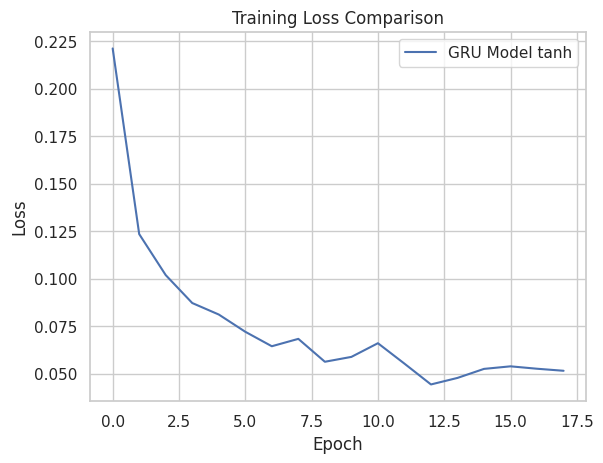

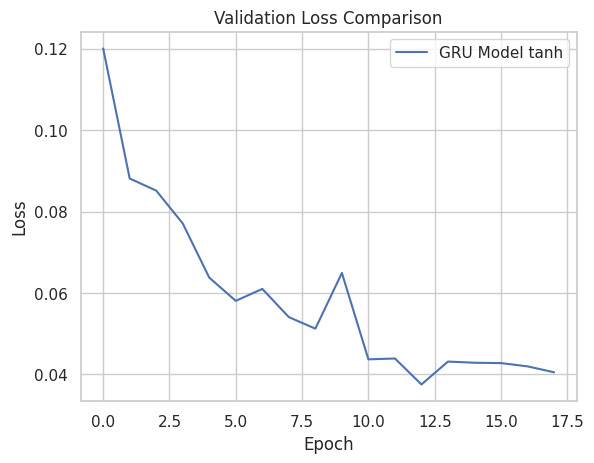

In [683]:
# Compare the training loss of each model

plt.plot(history_cnn_gru['loss'], label='GRU Model tanh')

plt.title('Training Loss Comparison')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Compare the validation loss of each model

plt.plot(history_cnn_gru['val_loss'], label='GRU Model tanh')

plt.title('Validation Loss Comparison')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

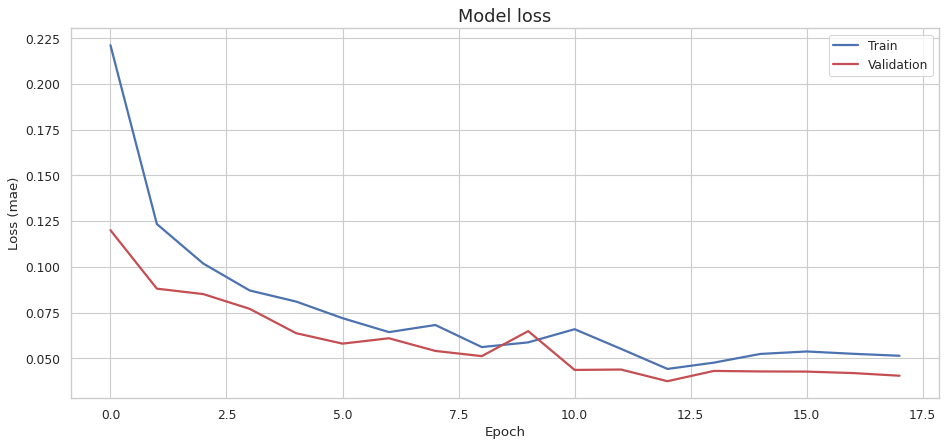

In [684]:
#history=history4
#model=model4

history=history_cnn_gru
model=model_cnn_gru
# plot the training losses
fig, ax = plt.subplots(figsize=(14, 6), dpi=80)
ax.plot(history['loss'], 'b', label='Train', linewidth=2)
ax.plot(history['val_loss'], 'r', label='Validation', linewidth=2)
ax.set_title('Model loss', fontsize=16)
ax.set_ylabel('Loss (mae)')
ax.set_xlabel('Epoch')
ax.legend(loc='upper right')
plt.show()

In [685]:
# prompt: bu model ile prediction yap mae mse rmse mape hesapla
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import numpy as np

if model == model_cnn_gru:
    X_pred = model.predict(X_test)


    # Reshape to (samples, features) while considering the timesteps
    mae = mean_absolute_error(X_test.reshape(X_test.shape[0], -1),
                              X_pred[:, -1, :].reshape(X_pred.shape[0], -1)) # Use only the last timestep of predictions
    mse = mean_squared_error(X_test.reshape(X_test.shape[0], -1),
                              X_pred[:, -1, :].reshape(X_pred.shape[0], -1)) # Use only the last timestep of predictions
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(X_test.reshape(X_test.shape[0], -1),
                                        X_pred[:, -1, :].reshape(X_pred.shape[0], -1)) # Use only the last timestep of predictions

    print(f"MAE: {mae}")
    print(f"MSE: {mse}")
    print(f"RMSE: {rmse}")
    print(f"MAPE: {mape}")


405/405 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step
MAE: 0.047416808875165695
MSE: 0.004119556162396699
RMSE: 0.06418376868334158
MAPE: 11819776257748.627


In [686]:
# prompt: # prompt: bu model ile prediction yap mae mse rmse mape ve r2 hesapla

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

if model == model_cnn_gru:
    X_pred = model.predict(X_test)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_test.reshape(X_test.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"MAE: {mae}")
    print(f"MSE: {mse}")
    print(f"RMSE: {rmse}")
    print(f"MAPE: {mape}")
    print(f"R2: {r2}")

405/405 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
MAE: 0.047416808875165695
MSE: 0.004119556162396699
RMSE: 0.06418376868334158
MAPE: 11819776257748.627
R2: 0.8941690555742763


In [687]:
# plot the loss distribution of the training set


X_pred = model.predict(X_train)

if model == model4:
    X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
else:
    X_pred = X_pred[:, -1, :]
    X_pred = X_pred.reshape(X_pred.shape[0], -1)

X_pred = pd.DataFrame(X_pred, columns=train.columns)
X_pred.index = train.index

scored = pd.DataFrame(index=train.index)
if model == model4:
    Xtrain = X_train.reshape(X_train.shape[0], X_train.shape[2])
else:
    Xtrain = X_train[:, -1, :]
    Xtrain = Xtrain.reshape(X_train.shape[0], -1)
scored['Loss_mae'] = np.mean(np.abs(X_pred-Xtrain), axis = 1)

76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [688]:
features

,feature
46,Grd_RtrInvPhase3_Temp_Avg
3,Gen_RPM_Std
23,Prod_LatestAvg_ActPwrGen1
26,Prod_LatestAvg_ReactPwrGen0


In [ ]:
# prompt: z skor nedir açıklar mısın

# Z-skoru, bir veri noktasının ortalamadan kaç standart sapma uzaklığında olduğunu gösteren bir ölçüttür.
# Veri setindeki bir değerin, ortalamaya göre ne kadar farklı olduğunu ifade eder.

# Z-skoru hesaplama formülü:
# Z = (X - μ) / σ

# Burada:
# X: Veri noktası
# μ: Veri setinin ortalaması
# σ: Veri setinin standart sapması


# Z-skoru, verileri standartlaştırmak ve karşılaştırmak için kullanılır.
# Örneğin, farklı birimlerde ölçülen verileri karşılaştırabilirsiniz.
# Ayrıca, aykırı değerleri tespit etmek için de kullanılabilir.
# Aykırı değerler, genellikle Z-skoru 3'ten büyük veya -3'ten küçük olan verilerdir.


# Örnek:
# Bir sınıfta öğrencilerin matematik notları aşağıdaki gibidir:
# 60, 70, 75, 80, 85, 90, 95, 100

# Ortalama: (60+70+75+80+85+90+95+100) / 8 = 81.25
# Standart sapma: 12.5

# 60 notunun Z-skoru: (60 - 81.25) / 12.5 = -1.7
# 100 notunun Z-skoru: (100 - 81.25) / 12.5 = 1.5


# Bu örnekte, 60 notunun Z-skoru -1.7'dir, bu da ortalamadan 1.7 standart sapma uzaklıkta olduğunu gösterir.
# 100 notunun Z-skoru 1.5'dir, bu da ortalamadan 1.5 standart sapma uzaklıkta olduğunu gösterir.


Otomatik olarak belirlenen eşik değeri: 0.10399262190261563


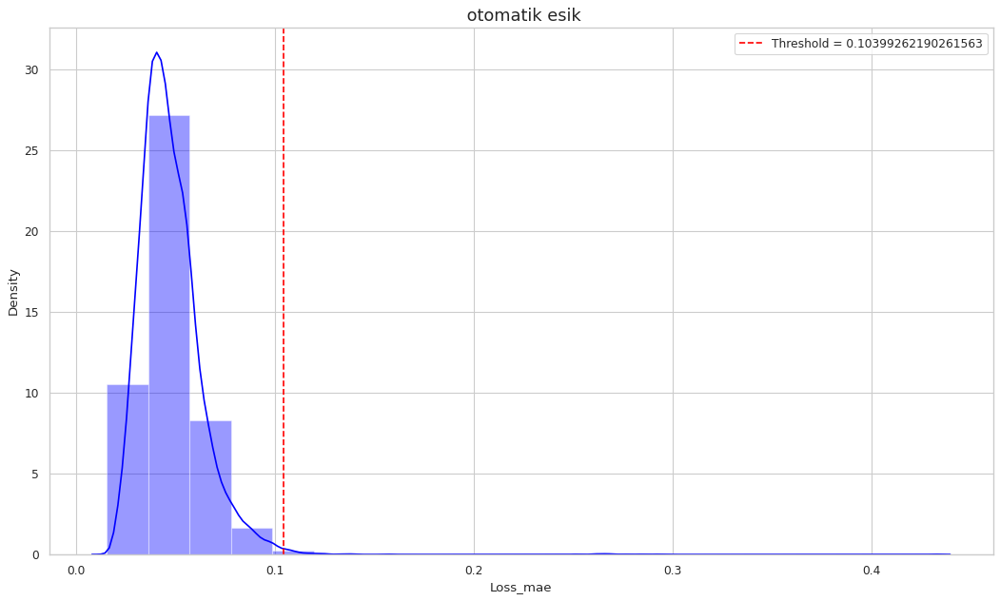

In [710]:
# Kayıp değerlerini alın
loss_values = scored['Loss_mae'].values

# Kayıp değerlerinin z-skorlarını hesaplayın
z_scores = (loss_values - np.mean(loss_values)) / np.std(loss_values)

# Eşik değeri için bir z-score belirleyin
threshold_z_score = 5 # Örnek olarak, 3.0 z-score'u kullanıyoruz

# Eşik değeri hesaplayın
threshold_value = np.mean(loss_values) + threshold_z_score * np.std(loss_values)

# Eşik değeri görselleştirin
plt.figure(figsize=(16, 9), dpi=80)
plt.title(' otomatik esik', fontsize=16)
sns.distplot(scored['Loss_mae'], bins=20, kde=True, color='blue')
plt.axvline(x=threshold_value, color='red', linestyle='--', label=f'Threshold = {threshold_value}')
plt.legend()


# Eşik değerini ve tespit edilen anomalileri yazdırın
print(f"Otomatik olarak belirlenen eşik değeri: {threshold_value}")

In [795]:
# prompt: train veriseti üzerinden F1 skora göre threshold belirle  (şayet trainde fault var ise F1 skora göre belirler, train tamamı normal ise bu defa, itreasyon ile anomaly==0 olacak şekilde en küçük treshold belirler))

from sklearn.metrics import f1_score, precision_score, recall_score, roc_auc_score, accuracy_score
from sklearn.metrics import precision_recall_curve

# Tahmin edilen anomali skorlarını (Loss_mae) alın
y_scores = scored['Loss_mae'].values

# Gerçek etiketleri (Fault) alın
y_true = trainhy['Fault'].values

# F1 skorunu maksimize eden eşik değerini bulun
precision, recall, thresholds = precision_recall_curve(y_true, y_scores)
f1_scores = 2 * (precision * recall) / (precision + recall)
f1_scores = [score if not np.isnan(score) else 0 for score in f1_scores]
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]

print(f"F1 skoru için en iyi eşik değeri: {optimal_threshold}")

# Eşik değeri kullanarak tahminleri oluşturun
y_pred = [1 if score > optimal_threshold else 0 for score in y_scores]

# Performansı değerlendirin
f1 = f1_score(y_true, y_pred)
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)

print(f"F1 skoru: {f1}")
print(f"Doğruluk: {accuracy}")
print(f"Keskinlik: {precision}")
print(f"Duyarlılık: {recall}")

# Eşik değeri ve tespit edilen anomalileri yazdırın
print(f"Otomatik olarak belirlenen eşik değeri: {optimal_threshold}")

# İsteğe bağlı olarak, bulduğunuz eşik değerini kullanarak anomali tespitini yapabilirsiniz:
# anomalies = scored[scored['Loss_mae'] > optimal_threshold]

if f1==0:
    threshold_values = np.linspace(0, 5, 100)  # 0 ile 1 arasında 1000 eşik değeri oluştur
    num_anomalies_list = []

    for threshold in threshold_values:
        X_pred = model.predict(X_train)

        if model == model4:
            X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
        else:
            X_pred = X_pred[:, -1, :]
            X_pred = X_pred.reshape(X_pred.shape[0], -1)

        X_pred = pd.DataFrame(X_pred, columns=train.columns)
        X_pred.index = train.index

        scored = pd.DataFrame(index=train.index)
        if model == model4:
            Xtrain = X_train.reshape(X_train.shape[0], X_train.shape[2])
        else:
            Xtrain = X_train[:, -1, :]
            Xtrain = Xtrain.reshape(X_train.shape[0], -1)
        scored['Loss_mae'] = np.mean(np.abs(X_pred - Xtrain), axis=1)

        # Anomalileri tespit et
        anomalies = scored[scored['Loss_mae'] > threshold]

        num_anomalies_list.append(len(anomalies))

    # 0 anomali sayısına sahip ilk eşik değerini bul
    for i, num_anomalies in enumerate(num_anomalies_list):
        if num_anomalies == 0:
            first_threshold_with_zero_anomalies = threshold_values[i]
            print(f"0 anomaliye sahip ilk eşik değeri: {first_threshold_with_zero_anomalies}")
            threshold_value = first_threshold_with_zero_anomalies
            break
else:
    threshold_value = optimal_threshold



F1 skoru için en iyi eşik değeri: 0.12339525403289253
F1 skoru: 0.0
Doğruluk: 1.0
Keskinlik: 0.0
Duyarlılık: 0.0
Otomatik olarak belirlenen eşik değeri: 0.12339525403289253
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
76/76 ━━

In [796]:
threshold_value

0.15151515151515152

In [798]:
# plot the loss distribution of the training set


X_pred = model.predict(X_train)
  # Son zaman adımının tahminlerini seçin
if model == model4:
  X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
else:
  X_pred = X_pred[:, -1, :]
  X_pred = X_pred.reshape(X_pred.shape[0], -1)
  # X_pred'i 2 boyutlu hale getirin

X_pred = pd.DataFrame(X_pred, columns=train.columns)
X_pred.index = train.index

scored = pd.DataFrame(index=train.index)

if model == model4:
    Xtrain = X_train.reshape(X_train.shape[0], X_train.shape[2])
else:
    Xtrain = X_train[:, -1, :]
    Xtrain = Xtrain.reshape(X_train.shape[0], -1)
scored['Loss_mae'] = np.mean(np.abs(X_pred-Xtrain), axis = 1)

76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [799]:
X_pred = model.predict(X_test)

if model == model4:
  X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
else:
  X_pred = X_pred[:, -1, :]
  X_pred = X_pred.reshape(X_pred.shape[0], -1)

X_pred = pd.DataFrame(X_pred, columns=test.columns)
X_pred.index = test.index

scored= pd.DataFrame(index=test.index)
if model == model4:
  Xtest = X_test.reshape(X_test.shape[0], X_test.shape[2])
else:
  Xtest = X_test[:, -1, :]
  Xtest = X_test.reshape(X_pred.shape[0], -1)

scored['Loss_mae'] = np.mean(np.abs(X_pred-Xtest), axis = 1)

405/405 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


In [800]:
X_pred

,Grd_RtrInvPhase3_Temp_Avg,Gen_RPM_Std,Prod_LatestAvg_ActPwrGen1,Prod_LatestAvg_ReactPwrGen0,Grd_RtrInvPhase3_Temp_Avg_rolling_mean,Grd_RtrInvPhase3_Temp_Avg_rolling_std,Grd_RtrInvPhase3_Temp_Avg_rolling_max,Grd_RtrInvPhase3_Temp_Avg_rolling_min,Gen_RPM_Std_rolling_mean,Gen_RPM_Std_rolling_std,Gen_RPM_Std_rolling_max,Gen_RPM_Std_rolling_min,Prod_LatestAvg_ActPwrGen1_rolling_mean,Prod_LatestAvg_ActPwrGen1_rolling_std,Prod_LatestAvg_ActPwrGen1_rolling_max,Prod_LatestAvg_ActPwrGen1_rolling_min,Prod_LatestAvg_ReactPwrGen0_rolling_mean,Prod_LatestAvg_ReactPwrGen0_rolling_std,Prod_LatestAvg_ReactPwrGen0_rolling_max,Prod_LatestAvg_ReactPwrGen0_rolling_min
Timestamp,,,,,,,,,,,,,,,,,,,,
2016-02-22 20:10:00+00:00,0.535925,0.132329,0.054827,0.657843,0.516332,0.059291,0.527387,0.520448,0.264152,0.369122,0.483156,0.088479,0.070005,0.155601,0.171706,0.025528,0.798457,-0.009026,0.573269,0.861468
2016-02-22 20:40:00+00:00,0.509681,0.146684,0.053225,0.662481,0.489749,0.057436,0.506167,0.494471,0.250192,0.347076,0.451605,0.080859,0.058760,0.153405,0.166857,0.018927,0.796428,-0.015705,0.573994,0.859997
2016-02-22 20:50:00+00:00,0.500505,0.197350,0.055437,0.665130,0.490620,0.056578,0.513981,0.497022,0.262689,0.345947,0.451073,0.088424,0.057179,0.154217,0.179722,0.019493,0.798945,-0.019177,0.576226,0.861156
2016-02-22 21:20:00+00:00,0.537260,0.083466,0.007400,0.659781,0.511721,0.072001,0.540049,0.511017,0.168307,0.233093,0.307669,0.057516,0.016511,0.134778,0.108419,-0.002259,0.794889,-0.006500,0.577826,0.865065
2016-02-22 21:30:00+00:00,0.538543,0.074742,0.001102,0.659649,0.511704,0.072669,0.540113,0.511605,0.164896,0.235246,0.308477,0.053734,0.012731,0.134374,0.102365,-0.006536,0.795605,-0.006779,0.578602,0.866365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 20:50:00+00:00,0.502347,0.604786,0.363580,0.642478,0.537453,0.097459,0.590613,0.513807,0.593653,0.342604,0.647569,0.466083,0.447989,0.257082,0.598117,0.298555,0.829182,0.012212,0.568283,0.857523
2016-12-31 21:30:00+00:00,0.521742,0.486287,0.340672,0.639311,0.535973,0.104671,0.581543,0.508579,0.553692,0.348379,0.643361,0.435277,0.435285,0.253182,0.556695,0.281749,0.825288,0.015292,0.566223,0.860246
2016-12-31 21:40:00+00:00,0.499329,0.616607,0.358853,0.642730,0.537419,0.096974,0.592425,0.514719,0.596368,0.342006,0.647679,0.468218,0.445203,0.256056,0.597328,0.296499,0.830292,0.012311,0.569318,0.857951


In [801]:
Xtest

array([[0.5       , 0.11185468, 0.12602676, ..., 0.        , 0.53846154,
        0.84367816],
       [0.5       , 0.15583174, 0.12105998, ..., 0.        , 0.53846154,
        0.84367816],
       [0.5       , 0.23231358, 0.13093961, ..., 0.        , 0.53846154,
        0.84367816],
       ...,
       [0.54545455, 0.62237094, 0.31938062, ..., 0.        , 0.53846154,
        0.84367816],
       [0.54545455, 0.55258126, 0.30331198, ..., 0.        , 0.53846154,
        0.84367816],
       [0.54545455, 0.59751434, 0.29051459, ..., 0.        , 0.53846154,
        0.84367816]])

In [802]:
# prompt: plotly ile çiz ve threshold çizgisini ve gerçek arıza noktalarını yerleştir

import plotly.graph_objects as go
scored_test=scored.copy()
scored_test['Fault']=testhy['Fault']
# Calculate the exponential moving average (EMA)
window = 6 # Adjust the window size as needed
scored_test['EMA'] = scored_test['Loss_mae'].ewm(span=window, adjust=False).mean()

# Create a figure
fig = go.Figure()

# Add the loss values as a scatter plot
fig.add_trace(go.Scatter(
    x=scored_test.index,
    y=scored_test['Loss_mae'],
    mode='lines',
    name='Loss'
))

# Add the EMA as a line plot
fig.add_trace(go.Scatter(
    x=scored_test.index,
    y=scored_test['EMA'],
    mode='lines',
    name='EMA'
))

# Add the threshold line
fig.add_shape(
    type="line",
    x0=scored_test.index.min(),
    x1=scored_test.index.max(),
    y0=threshold_value,
    y1=threshold_value,
    line=dict(
        color="red",
        dash="dash",
    )
)

# Add the actual fault points
fault_indices = testhy[testhy['Fault'] == 1].index
fig.add_trace(go.Scatter(
    x=fault_indices,
    y=scored_test.loc[fault_indices]['Loss_mae'],
    mode='markers',
    name='Actual Faults',
    marker=dict(
        color='green',
        size=8
    )
))

# Set the layout
fig.update_layout(
    title="Test Data Loss over Time with Threshold and Actual Faults",
    xaxis_title="Time",
    yaxis_title="Loss",
    showlegend=True
)

# Display the plot
fig.show()


In [803]:
# prompt: eşiğin aşıldığı  zamanları tarih bilgisiyle birlikte kesikli çizgilerle grafikte göster göster

import plotly.graph_objects as go

# ... (Your existing code) ...

# Create a figure
fig = go.Figure()

# Add the loss values as a scatter plot
fig.add_trace(go.Scatter(
    x=scored_test.index,
    y=scored_test['Loss_mae'],
    mode='lines',
    name='Loss'
))

# Add the EMA as a line plot
fig.add_trace(go.Scatter(
    x=scored_test.index,
    y=scored_test['EMA'],
    mode='lines',
    name='EMA'
))

# Add the threshold line
fig.add_shape(
    type="line",
    x0=scored_test.index.min(),
    x1=scored_test.index.max(),
    y0=threshold_value,
    y1=threshold_value,
    line=dict(
        color="red",
        dash="dash",
    )
)


# Find the time points where the threshold is exceeded
threshold_exceeded_indices = scored_test[scored_test['Loss_mae'] > threshold_value].index

# Add vertical lines for threshold exceedances
for index in threshold_exceeded_indices:
  fig.add_shape(
      type="line",
      x0=index,
      x1=index,
      y0=0,
      y1=scored_test['Loss_mae'].max(),
      line=dict(
          color="black",
          dash="dash",
      )
  )

# Add the actual fault points
fault_indices = testhy[testhy['Fault'] == 1].index
fig.add_trace(go.Scatter(
    x=fault_indices,
    y=scored_test.loc[fault_indices]['Loss_mae'],
    mode='markers',
    name='Actual Faults',
    marker=dict(
        color='green',
        size=8
    )
))

# Set the layout
fig.update_layout(
    title="Test Data Loss over Time with Threshold and Actual Faults",
    xaxis_title="Time",
    yaxis_title="Loss",
    showlegend=True
)

# Display the plot
fig.show()


In [804]:
# prompt: eşiğin aşılma zamanlarını göster

# Find the time points where the threshold is exceeded
threshold_exceeded_indices = scored_test[scored_test['Loss_mae'] > threshold_value].index

# Print the time points
print("Eşik Değerini Aşan Zaman Noktaları:")
for index in threshold_exceeded_indices:
  print(index)

Eşik Değerini Aşan Zaman Noktaları:
2016-03-03 05:00:00+00:00
2016-03-03 05:10:00+00:00
2016-03-03 07:00:00+00:00
2016-03-03 07:30:00+00:00
2016-03-03 19:20:00+00:00
2016-03-03 19:50:00+00:00
2016-03-03 21:20:00+00:00
2016-03-03 21:30:00+00:00
2016-03-03 21:40:00+00:00
2016-03-03 21:50:00+00:00
2016-12-16 06:00:00+00:00


In [806]:
# prompt: doğru negatifleri de kullan

# ... (Your existing code) ...

# Gerçek arızaları ve tespit edilen arızaları karşılaştır
true_positives = 0
false_positives = 0
false_negatives = 0
true_negatives = 0  # Doğru negatifleri hesaplamak için değişken

for index, row in scored_test.iterrows():
    if row['Fault'] == 1 and row['Loss_mae'] > threshold_value:
        true_positives += 1
    elif row['Fault'] == 0 and row['Loss_mae'] > threshold_value:
        false_positives += 1
    elif row['Fault'] == 1 and row['Loss_mae'] <= threshold_value:
        false_negatives += 1
    elif row['Fault'] == 0 and row['Loss_mae'] <= threshold_value:
        true_negatives += 1  # Doğru negatifleri say

# Doğruluk, hassasiyet, geri çağırma ve F1 puanını hesapla
if true_positives + false_positives > 0:
    precision = true_positives / (true_positives + false_positives)
else:
    precision = 0

if true_positives + false_negatives > 0:
    recall = true_positives / (true_positives + false_negatives)
else:
    recall = 0

if precision + recall > 0:
    f1_score = 2 * (precision * recall) / (precision + recall)
else:
    f1_score = 0

accuracy = (true_positives + true_negatives) / len(scored_test)

# Sonuçları yazdır
print("Doğru Pozitifler:", true_positives)
print("Yanlış Pozitifler:", false_positives)
print("Yanlış Negatifler:", false_negatives)
print("Doğru Negatifler:", true_negatives)  # Doğru negatifleri yazdır
print("Hassasiyet:", precision)
print("Geri Çağırma:", recall)
print("F1 Puanı:", f1_score)
print("Doğruluk:", accuracy)

Doğru Pozitifler: 1
Yanlış Pozitifler: 10
Yanlış Negatifler: 0
Doğru Negatifler: 12942
Hassasiyet: 0.09090909090909091
Geri Çağırma: 1.0
F1 Puanı: 0.16666666666666669
Doğruluk: 0.9992279780745773


In [818]:
# prompt: Doğru Pozitifler:
# Yanlış Pozitifler:
# Yanlış Negatifler:
# Doğru Negatifler:         değerlerini manuel gir ve metrikleri hesapla

# Değerleri manuel olarak girin
true_positives = 10
false_positives = 1
false_negatives = 0
true_negatives = true_negatives

# Hassasiyet hesapla
if true_positives + false_positives > 0:
  precision = true_positives / (true_positives + false_positives)
else:
  precision = 0

# Geri çağırma hesapla
if true_positives + false_negatives > 0:
  recall = true_positives / (true_positives + false_negatives)
else:
  recall = 0

# F1 puanı hesapla
if precision + recall > 0:
  f1_score = 2 * (precision * recall) / (precision + recall)
else:
  f1_score = 0

# Doğruluk hesapla
accuracy = (true_positives + true_negatives) / (true_positives + false_positives + false_negatives + true_negatives)


# Sonuçları yazdır
print("Doğru Pozitifler:", true_positives)
print("Yanlış Pozitifler:", false_positives)
print("Yanlış Negatifler:", false_negatives)
print("Doğru Negatifler:", true_negatives)
print("Hassasiyet:", precision)
print("Geri Çağırma:", recall)
print("F1 Puanı:", f1_score)
print("Doğruluk:", accuracy)

Doğru Pozitifler: 10
Yanlış Pozitifler: 1
Yanlış Negatifler: 0
Doğru Negatifler: 6789
Hassasiyet: 0.9090909090909091
Geri Çağırma: 1.0
F1 Puanı: 0.9523809523809523
Doğruluk: 0.9998529411764706


In [819]:
# prompt: yukarıdaki modeli kullanarak predicition yap

# Make predictions on the test data

X_pred = model.predict(X_test)

    # Reshape the predictions
if model==model4:
        X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])

else:
        X_pred = X_pred[:, -1, :]
        X_pred = X_pred.reshape(X_pred.shape[0], -1)


    # Convert predictions to a DataFrame
X_pred = pd.DataFrame(X_pred, columns=test.columns)
X_pred.index = test.index

    # Calculate the reconstruction loss
scored = pd.DataFrame(index=test.index)
if model==model4:

   Xtest = X_test.reshape(X_test.shape[0], X_test.shape[2])
else:
   Xtest = X_test[:, -1, :]
   Xtest = Xtest.reshape(X_test.shape[0], -1)

scored['Loss_mae'] = np.mean(np.abs(X_pred - Xtest), axis=1)

    # Add the actual fault values to the scored DataFrame
scored['Fault'] = testhy['Fault']

    # Calculate the EMA (Exponential Moving Average)
window = 50  # Adjust the window size as needed
scored['EMA'] = scored['Loss_mae'].ewm(span=window, adjust=False).mean()

    # Identify anomalies based on the threshold
anomalies = scored[scored['Loss_mae'] > threshold_value]

    # Print the anomalies
print("Anomalies:")
print(anomalies)


405/405 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Anomalies:
                           Loss_mae  Fault       EMA
Timestamp                                           
2016-03-03 05:00:00+00:00  0.292007      0  0.051978
2016-03-03 05:10:00+00:00  0.275635      0  0.060749
2016-03-03 07:00:00+00:00  0.265207      0  0.068767
2016-03-03 07:30:00+00:00  0.267215      0  0.076549
2016-03-03 19:20:00+00:00  0.432040      1  0.090490
2016-03-03 19:50:00+00:00  0.283594      0  0.098063
2016-03-03 21:20:00+00:00  0.261162      0  0.104459
2016-03-03 21:30:00+00:00  0.261621      0  0.110622
2016-03-03 21:40:00+00:00  0.268133      0  0.116799
2016-03-03 21:50:00+00:00  0.251400      0  0.122077
2016-12-16 06:00:00+00:00  0.156500      0  0.061011


In [809]:
Xtest

array([[0.5       , 0.11185468, 0.12602676, ..., 0.        , 0.53846154,
        0.84367816],
       [0.5       , 0.15583174, 0.12105998, ..., 0.        , 0.53846154,
        0.84367816],
       [0.5       , 0.23231358, 0.13093961, ..., 0.        , 0.53846154,
        0.84367816],
       ...,
       [0.54545455, 0.62237094, 0.31938062, ..., 0.        , 0.53846154,
        0.84367816],
       [0.54545455, 0.55258126, 0.30331198, ..., 0.        , 0.53846154,
        0.84367816],
       [0.54545455, 0.59751434, 0.29051459, ..., 0.        , 0.53846154,
        0.84367816]])

In [810]:
# prompt: feature selection sütunlarını göster
selected_features_xgb

,feature
46,Grd_RtrInvPhase3_Temp_Avg
3,Gen_RPM_Std
23,Prod_LatestAvg_ActPwrGen1
26,Prod_LatestAvg_ReactPwrGen0


In [811]:
import plotly.graph_objects as go

# Assuming 'scaler1' is the MinMaxScaler object used for scaling
X_pred_original = scaler.inverse_transform(X_pred)
Xtest_original = scaler.inverse_transform(Xtest)

# Create a DataFrame with the original values
X_pred_org = pd.DataFrame(X_pred_original, columns=test.columns, index=test.index)
Xtest_org = pd.DataFrame(Xtest_original, columns=test.columns, index=test.index)

# Select a few features for visualization
features_to_plot = my_tuple

# Create subplots for each selected feature
for feature in features_to_plot:
  fig = go.Figure()

  # Plot X_pred values
  fig.add_trace(go.Scatter(
      x=X_pred_org.index,
      y=X_pred_org[feature],
      mode='lines',
      name='X_pred',
      line=dict(color='blue')
  ))

  # Plot X_test values
  fig.add_trace(go.Scatter(
      x=X_pred_org.index,
      y=Xtest_org[feature],  # Use the column name directly to access the values
      mode='lines',
      name='X_test',
      line=dict(color='red')
  ))

      # Add the threshold line
  fig.add_shape(
      type="line",
      x0=scored_test.index.min(),
      x1=scored_test.index.max(),
      y0=threshold_value,
      y1=threshold_value,
      line=dict(
          color="red",
          dash="dash"
  ))

  fig.update_layout(
      title=f"Comparison of {feature} between X_pred and X_test",
      xaxis_title="Time",
      yaxis_title=feature,
      showlegend=True
  )

  fig.show()

In [812]:
data_af

,Grd_RtrInvPhase3_Temp_Avg,Gen_RPM_Std,Prod_LatestAvg_ActPwrGen1,Prod_LatestAvg_ReactPwrGen0,Grd_RtrInvPhase3_Temp_Avg_rolling_mean,Grd_RtrInvPhase3_Temp_Avg_rolling_std,Grd_RtrInvPhase3_Temp_Avg_rolling_max,Grd_RtrInvPhase3_Temp_Avg_rolling_min,Gen_RPM_Std_rolling_mean,Gen_RPM_Std_rolling_std,...,Gen_RPM_Std_rolling_min,Prod_LatestAvg_ActPwrGen1_rolling_mean,Prod_LatestAvg_ActPwrGen1_rolling_std,Prod_LatestAvg_ActPwrGen1_rolling_max,Prod_LatestAvg_ActPwrGen1_rolling_min,Prod_LatestAvg_ReactPwrGen0_rolling_mean,Prod_LatestAvg_ReactPwrGen0_rolling_std,Prod_LatestAvg_ReactPwrGen0_rolling_max,Prod_LatestAvg_ReactPwrGen0_rolling_min,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,0.366667,0.025144,0.123792,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
2016-01-01 00:30:00+00:00,0.366667,0.065401,0.232810,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
2016-01-01 01:00:00+00:00,0.366667,0.037314,0.127659,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
2016-01-01 01:10:00+00:00,0.366667,0.014578,0.104319,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
2016-01-01 01:20:00+00:00,0.366667,0.022335,0.105893,0.878939,0.363333,0.010541,0.366667,0.333333,0.023352,0.017446,...,0.008560,0.102769,0.064591,0.232810,0.020683,0.877225,0.005419,0.878939,0.861802,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 20:50:00+00:00,0.400000,0.084927,0.332178,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,...,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.000000,0.878939,0.878939,0
2016-12-31 21:30:00+00:00,0.400000,0.058446,0.263671,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,...,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.000000,0.878939,0.878939,0
2016-12-31 21:40:00+00:00,0.400000,0.087067,0.319986,0.878939,0.403333,0.010541,0.433333,0.400000,0.069533,0.013936,...,0.049753,0.339741,0.129154,0.701003,0.257641,0.878939,0.000000,0.878939,0.878939,0


In [813]:
# prompt: data_af her bir features isimleri için ayrı ayrı  test ve train için mae mape rmse mse r2 değerlerini hesapla

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

if model == model_cnn_gru:
    X_pred = model.predict(X_test)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_test.reshape(X_test.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    for feature_index in range(y_true.shape[1]):
        feature_y_true = y_true[:, feature_index]
        feature_y_pred = y_pred[:, feature_index]

        mae = mean_absolute_error(feature_y_true, feature_y_pred)
        mse = mean_squared_error(feature_y_true, feature_y_pred)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(feature_y_true, feature_y_pred)
        r2 = r2_score(feature_y_true, feature_y_pred)

        print(f"Feature {test.columns[feature_index]}")
        print(f"  MAE: {mae}")
        print(f"  MSE: {mse}")
        print(f"  RMSE: {rmse}")
        print(f"  MAPE: {mape}")
        print(f"  R2: {r2}")


if model == model_cnn_gru:
    X_pred = model.predict(X_train)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_train.reshape(X_train.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    for feature_index in range(y_true.shape[1]):
        feature_y_true = y_true[:, feature_index]
        feature_y_pred = y_pred[:, feature_index]

        mae = mean_absolute_error(feature_y_true, feature_y_pred)
        mse = mean_squared_error(feature_y_true, feature_y_pred)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(feature_y_true, feature_y_pred)
        r2 = r2_score(feature_y_true, feature_y_pred)

        print(f"Train Feature {train.columns[feature_index]}")
        print(f"  MAE: {mae}")
        print(f"  MSE: {mse}")
        print(f"  RMSE: {rmse}")
        print(f"  MAPE: {mape}")
        print(f"  R2: {r2}")

405/405 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
Feature Grd_RtrInvPhase3_Temp_Avg
  MAE: 0.06476204386464463
  MSE: 0.007208423790687828
  RMSE: 0.08490243689487262
  MAPE: 10813714746178.809
  R2: 0.9219209473459358
Feature Gen_RPM_Std
  MAE: 0.0436645346041828
  MSE: 0.003795182069733682
  RMSE: 0.06160504906039506
  MAPE: 8932539468503.402
  R2: 0.9317316597703738
Feature Prod_LatestAvg_ActPwrGen1
  MAE: 0.05549348422941142
  MSE: 0.0058340552223771405
  RMSE: 0.07638098730952056
  MAPE: 24766453755023.12
  R2: 0.9605543748056515
Feature Prod_LatestAvg_ReactPwrGen0
  MAE: 0.05703767504106355
  MSE: 0.005782065245383264
  RMSE: 0.076039892460361
  MAPE: 292316471395.5451
  R2: 0.6366243762148334
Feature Grd_RtrInvPhase3_Temp_Avg_rolling_mean
  MAE: 0.04238888344102538
  MSE: 0.0030076560245896793
  RMSE: 0.054842100840409816
  MAPE: 2711282433356.2173
  R2: 0.9639815241150068
Feature Grd_RtrInvPhase3_Temp_Avg_rolling_std
  MAE: 0.0533895591069392
  MSE: 0.004416155727645282
  RMSE: 0.066454

In [814]:
# prompt:       print(f"Train Feature {train.columns[feature_index]}")
#         print(f"  MAE: {mae}")
#         print(f"  MSE: {mse}")
#         print(f"  RMSE: {rmse}")
#         print(f"  MAPE: {mape}")
#         print(f"  R2: {r2}")     sonuçları için tablo oluştur

import pandas as pd

results_data = []

if model == model_cnn_gru:
    X_pred = model.predict(X_train)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_train.reshape(X_train.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    for feature_index in range(y_true.shape[1]):
        feature_y_true = y_true[:, feature_index]
        feature_y_pred = y_pred[:, feature_index]

        mae = mean_absolute_error(feature_y_true, feature_y_pred)
        mse = mean_squared_error(feature_y_true, feature_y_pred)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(feature_y_true, feature_y_pred)
        r2 = r2_score(feature_y_true, feature_y_pred)

        results_data.append([train.columns[feature_index], mae, mse, rmse, mape, r2])

results_df = pd.DataFrame(results_data, columns=['Feature', 'MAE', 'MSE', 'RMSE', 'MAPE', 'R2'])
results_df

76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


,Feature,MAE,MSE,RMSE,MAPE,R2
0,Grd_RtrInvPhase3_Temp_Avg,0.059410,0.006461,0.080379,2.815523e+13,0.930147
1,Gen_RPM_Std,0.038967,0.002969,0.054488,5.866509e+12,0.935528
2,Prod_LatestAvg_ActPwrGen1,0.050971,0.005240,0.072386,3.133330e+13,0.965591
3,Prod_LatestAvg_ReactPwrGen0,0.055981,0.005568,0.074616,4.880641e+11,0.740754
4,Grd_RtrInvPhase3_Temp_Avg_rolling_mean,0.041331,0.002512,0.050125,8.004190e+12,0.969815
5,Grd_RtrInvPhase3_Temp_Avg_rolling_std,0.043725,0.003071,0.055417,1.730100e+13,0.878709
6,Grd_RtrInvPhase3_Temp_Avg_rolling_max,0.031194,0.001712,0.041379,5.140581e+12,0.981055
7,Grd_RtrInvPhase3_Temp_Avg_rolling_min,0.045135,0.002833,0.053224,3.335634e+13,0.966075
8,Gen_RPM_Std_rolling_mean,0.049909,0.004182,0.064665,4.038303e+10,0.899402
9,Gen_RPM_Std_rolling_std,0.035512,0.002157,0.046446,4.929972e+09,0.952585


In [815]:
from google.colab import sheets
sheet = sheets.InteractiveSheet(df=results_df)

https://docs.google.com/spreadsheets/d/18PWouqLMztfgwMtoa_dQiZAeIP02GXplLhc1GXSRRuM#gid=0


In [816]:
# prompt: grafiğin arka planı beyaz olsu

fig.update_layout(
    plot_bgcolor='white',  # Arka plan rengini beyaz olarak ayarlayın
    xaxis=dict(gridcolor='lightgray'),  # X ekseni ızgara rengini açık gri olarak ayarlayın
    yaxis=dict(gridcolor='lightgray')   # Y ekseni ızgara rengini açık gri olarak ayarlayın
)
fig.show()


In [ ]:
# prompt: belirlediğim anomali tespit modeli için başka bir veri seti üzerinde transfer öğrenme işlemi yapmak istiyorum,

# Yeni veri setini yükleyin ve ön işleme adımlarını uygulayın.
# Örneğin:
new_data = pd.read_csv('new_dataset.csv')  # Yeni veri setinizin dosya yolunu belirtin.
# ... (Ön işleme adımları - Örneğin, eksik değerleri doldurma, normalleştirme vb.) ...

# Transfer öğrenme için mevcut modelinizi yükleyin.
loaded_model = keras.models.load_model('your_model.h5')  # Modelinizin dosya yolunu belirtin.


# Yeni veri setini modelinizin girişine uygun hale getirin.
# Örneğin, boyutları ve veri türleri aynı olmalıdır.
# ... (Gerekli dönüşümleri yapın) ...

# Modelinizin son katmanını çıkarın ve yeni bir çıktı katmanı ekleyin.
# Yeni veri seti için farklı sayıda sınıf varsa, çıktı katmanının boyutunu değiştirin.
num_classes_new_dataset = 2  # Yeni veri setinizdeki sınıf sayısını belirtin.
new_model = keras.models.Sequential()
for layer in loaded_model.layers[:-1]:  # Son katmanı hariç tüm katmanları ekleyin.
    new_model.add(layer)
new_model.add(keras.layers.Dense(num_classes_new_dataset, activation='softmax'))


# Yeni modeli eğitin.
# Öğrenme oranı, dönem sayısı gibi hiperparametreleri ayarlamanız gerekebilir.
new_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
# ... (Eğitim adımları) ...

# Yeni modeli değerlendirin.
# ... (Değerlendirme adımları) ...

# Yeni modeli kaydedin.
new_model.save('transfer_learned_model.h5')